# Data Augmentation Spotlight

# Step 1, Install USGG and Setup

## hardware and OS
To run this repo, you need 1 to 8 GPUs with CUDA. If you don't have a Nvidia Graphic card, no problem! This notebook is intended to run on Google Colab!

Don't forget to activate the GPU in **Goolgle Colab** ([how to](https://jovianlin.io/pytorch-with-gpu-in-google-colab/)) If you do not enable GPU from the beggining then you will have to restart te setup from beggining

If using **Kaggle kernel** do not forget to enable internet

**OS:** It is almost impossible to run this repo on Windows (believe me, I tried hard) because of many dependencies that are made for Linux. So better continue with Linux.

## Environment setup
before installing anything related to this project, first you need a version of PyTorch compatible with your GPU settings

with the 2 line script below you can check if your environment is ok.

In [2]:
! wget --quiet "https://raw.githubusercontent.com/pytorch/pytorch/master/torch/utils/collect_env.py"
! python collect_env.py

PyTorch version: 1.7.1
Is debug build: False
CUDA used to build PyTorch: 10.2
ROCM used to build PyTorch: N/A

OS: Ubuntu 18.04.5 LTS (x86_64)
GCC version: (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Clang version: Could not collect
CMake version: version 3.10.2

Python version: 3.6 (64-bit runtime)
Is CUDA available: True
CUDA runtime version: Could not collect
GPU models and configuration: 
GPU 0: Tesla P100-PCIE-16GB
GPU 1: Tesla P100-PCIE-16GB

Nvidia driver version: 450.51.06
cuDNN version: /usr/lib/x86_64-linux-gnu/libcudnn.so.7.6.3
HIP runtime version: N/A
MIOpen runtime version: N/A

Versions of relevant libraries:
[pip3] numpy==1.19.5
[pip3] torch==1.7.1
[pip3] torchvision==0.8.2
[conda] blas                      1.0                         mkl  
[conda] cudatoolkit               10.2.89              hfd86e86_0  
[conda] mkl                       2020.2                      256  
[conda] mkl-service               2.3.0            py36he8ac12f_0  
[conda] mkl_fft                   1.2.

- first, check that your computer detect your graphic card ``GPU 0: ...``
- second, you need a driver to use your GPU for any application: ``Nvidia driver version: ...``
- third, you need some libraries to run any data science algorith on your GPU: ``cuDNN version: ...`` and ``CUDA runtime version: ...``
- fourth, you need to install Pytorch after having all the things above so that Pytorch is built using the CUDA library: ``PyTorch version: 1.5.0+cu101`` and ``CUDA used to build PyTorch: 10.1``
- Finally, if your are on windows, you might also need ``Microsoft Visual C++ 14.0``

If any of these are missing, the project setup will probably fail somewhere. Below are the instruction to fix your environment.

### Setup


In [ ]:
! apt-get update
! pip install --upgrade pip

! apt-get install linux-headers-$(uname -r)
! apt-get -y install cmake

! conda update conda
! conda update conda-build

In [4]:
!gcc --version

gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



### Driver



In [6]:
# this command must work otherwise check the symLink /usr/local/cuda
!nvidia-smi

Mon Feb  8 08:35:27 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.06    Driver Version: 450.51.06    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  On   | 00000000:02:00.0 Off |                    0 |
| N/A   50C    P0    31W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla P100-PCIE...  On   | 00000000:84:00.0 Off |                    0 |
| N/A   

## CUDA
Note that each version of CUDA has a minimum requirement concerning the version of the driver


cuda toolkit: https://developer.nvidia.com/cuda-10.1-download-archive-base?target_os=Linux&target_arch=x86_64&target_distro=Ubuntu&target_version=1604&target_type=runfilelocal
example of thing you should install XD
```
wget https://developer.nvidia.com/compute/cuda/10.1/Prod/local_installers/cuda_10.1.105_418.39_linux.run
sh cuda_10.1.105_418.39_linux.run
```

## libnccl
Nvidia NCCL can be downloaded from: https://developer.nvidia.com/nccl/nccl-download (you need to create a free account)

## libcudnn
do not download ``libcudnn-dev``

then install it using this command ``dpkg -i libcudnn7_7.6.5.32-1+cuda10.1_amd64.deb``


## Pytorch
Get the command line that fits your hardware on this web site: https://pytorch.org/get-started/locally/
For example you should run something like the line below

In [ ]:
! pip install torch==1.5.0+cu101 torchvision==0.6.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

In [7]:
# now run the command below to see if Pytorch detects your GPUs
import torch
torch.cuda.is_available()

True

## Install the requirements
[github source](https://github.com/KaihuaTang/Scene-Graph-Benchmark.pytorch)

## Python libraries
Might take 5 to 10 mins to install all the rest. 

In [8]:
! pip install ipython scipy h5py

In [9]:
! pip install ninja yacs cython matplotlib tqdm opencv-python overrides

ends with `Successfully installed ninja-1.9.0.post1 overrides-3.0.0 yacs-0.1.7`

## Install PyCOCO tools (cocoapi)

In [ ]:
! git clone https://github.com/cocodataset/cocoapi.git

In [ ]:
! cd cocoapi/PythonAPI; python setup.py build_ext install

ends with 

```
Finished processing dependencies for pycocotools==2.0
```



## install apex
it is a PyTorch extension for easy mixed precision and distributed training in Pytorch

**bold text**### method 1

! git clone https://github.com/NVIDIA/apex.git
! cd apex ; python setup.py install --cuda_ext --cpp_ext

### method 2
https://stackoverflow.com/questions/57284345/how-to-install-nvidia-apex-on-google-colab

In [ ]:
%%writefile setup.sh

git clone https://github.com/NVIDIA/apex
pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" ./apex

In [ ]:
!sh setup.sh

In [ ]:
!pip install -v --no-cache-dir ./apex

ends with
```
Successfully installed apex-0.1
Cleaning up...
Removed build tracker '/tmp/pip-req-tracker-yl9p9317'
```

"A Python-only build" omits:
* Fused kernels **required** to use apex.optimizers.FusedAdam.
* Fused kernels **required** to use apex.normalization.FusedLayerNorm.
* Fused kernels that improve the performance and numerical stability of apex.parallel.SyncBatchNorm.
* Fused kernels that improve the performance of apex.parallel.DistributedDataParallel and apex.amp. DistributedDataParallel, amp, and SyncBatchNorm will still be usable, but they may be slower.

AMP: Automatic Mixed Precision: https://nvidia.github.io/apex/amp.html

## install PyTorch Detection (Scene-Graph-Benchmark.pytorch) from our repository
We change the file name from `Scene-Graph-Benchmark.pytorch` to `Scene`
because *ninja* can not handel certain characters in the directory's name
([source](https://stackoverflow.com/questions/54569963/error-building-depfile-has-multiple-output-paths-ninja-build-stopped-subcomm ))

In [8]:
! git clone git@github.com:htest_pc/semantic-augmentation.git
%cd semantic-augmentation
! git submodule update --init --recursive
%cd ..

Cloning into 'semantic-augmentation'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 14 (delta 4), reused 4 (delta 1), pack-reused 0
Receiving objects: 100% (14/14), 4.61 KiB | 4.61 MiB/s, done.
Resolving deltas: 100% (4/4), done.
/home/test_pc/Scene-Graph/semantic-augmentation
Submodule 'Scene' (https://github.com/KaihuaTang/Scene-Graph-Benchmark.pytorch.git) registered for path 'Scene'
Cloning into '/home/test_pc/Scene-Graph/semantic-augmentation/Scene'...
Submodule path 'Scene': checked out 'd0ffa40d92133d7d865e531146de82c8c8a344c0'
/home/test_pc/Scene-Graph


In [9]:
%cd semantic-augmentation
! cd Scene; python setup.py build develop

/home/test_pc/Scene-Graph/semantic-augmentation
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.6
creating build/lib.linux-x86_64-3.6/maskrcnn_benchmark
copying maskrcnn_benchmark/__init__.py -> build/lib.linux-x86_64-3.6/maskrcnn_benchmark
creating build/lib.linux-x86_64-3.6/maskrcnn_benchmark/data
copying maskrcnn_benchmark/data/collate_batch.py -> build/lib.linux-x86_64-3.6/maskrcnn_benchmark/data
copying maskrcnn_benchmark/data/__init__.py -> build/lib.linux-x86_64-3.6/maskrcnn_benchmark/data
copying maskrcnn_benchmark/data/build.py -> build/lib.linux-x86_64-3.6/maskrcnn_benchmark/data
creating build/lib.linux-x86_64-3.6/maskrcnn_benchmark/config
copying maskrcnn_benchmark/config/paths_catalog.py -> build/lib.linux-x86_64-3.6/maskrcnn_benchmark/config
copying maskrcnn_benchmark/config/defaults.py -> build/lib.linux-x86_64-3.6/maskrcnn_benchmark/config
copying maskrcnn_benchmark/config/__init__.py -> build/lib.linux-x86_64-3.6/maskrcnn_benchmark/confi

ends with:


```
Installed /content/Scene
Processing dependencies for maskrcnn-benchmark==0.1
Finished processing dependencies for maskrcnn-benchmark==0.1
```
otherwise you can get:
~~~
RuntimeError: Error compiling objects for extension
~~~


The line above might not work for many reasons:
* ninja is not installed
* the folder name contains crasy characters like space, points
* other reasons

follow carefully the instructions above to avoid any problem :)

### Additionnal instructions for Windows:
You might incounter this issue https://github.com/facebookresearch/maskrcnn-benchmark/issues/547
then you might need to run that first:
```
set "VS150COMNTOOLS=C:\Program Files (x86)\Microsoft Visual Studio\2019\Community\VC\Auxiliary\Build"
set CMAKE_GENERATOR=Visual Studio 16 2019 Win64
set DISTUTILS_USE_SDK=1
call "%VS150COMNTOOLS%\vcvarsall.bat" x64 -vcvars_ver=14.11
python setup.py build develop
call "C:\Program Files (x86)\Microsoft Visual Studio 14.0\VC\vcvarsall.bat"  x64 -vcvars_ver=14.0
```

## DATASET For training USGG
## VG images
Download the VG images part1 (9 Gb) part2 (5 Gb).

Please Extract these images to the directory datasets/vg/VG_100K/ 

If you want to use other directory, please link it in `DATASETS['VG_stanford_filtered']['img_dir']` of `maskrcnn_benchmark/config/paths_catelog.py`

In [10]:
! wget https://cs.stanford.edu/people/rak248/VG_100K_2/images.zip
! wget https://cs.stanford.edu/people/rak248/VG_100K_2/images2.zip
!unzip images.zip -d Scene/datasets/vg/
!rm -rf images.zip
! unzip images2.zip -d Scene/datasets/vg/
! rm -rf images2.zip
! echo Scene/datasets/vg/VG_100K_2/* | xargs mv -t Scene/datasets/vg/VG_100K/
!ls Scene/datasets/vg/


--2021-02-08 10:36:30--  https://cs.stanford.edu/people/rak248/VG_100K_2/images.zip
Resolving cs.stanford.edu (cs.stanford.edu)... 171.64.64.64
Connecting to cs.stanford.edu (cs.stanford.edu)|171.64.64.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9731705982 (9.1G) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]   9.06G  16.2MB/s    in 10m 13s 

2021-02-08 10:46:43 (15.1 MB/s) - ‘images.zip’ saved [9731705982/9731705982]

--2021-02-08 10:46:43--  https://cs.stanford.edu/people/rak248/VG_100K_2/images2.zip
Resolving cs.stanford.edu (cs.stanford.edu)... 171.64.64.64
Connecting to cs.stanford.edu (cs.stanford.edu)|171.64.64.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5471658058 (5.1G) [application/zip]
Saving to: ‘images2.zip’

images2.zip         100%[===================>]   5.10G  15.9MB/s    in 5m 37s  

2021-02-08 10:52:20 (15.5 MB/s) - ‘images2.zip’ saved [5471658058/5471658058]


## SGG pretrained model

The following code does this automatically:

Download the [scene graphs](https://onedrive.live.com/embed?cid=22376FFAD72C4B64&resid=22376FFAD72C4B64%21779871&authkey=AA33n7BRpB1xa3I) to `Scene/datasets/vg/VG-SGG-with-attri.h5` (144 Mb)

or you can edit the path in `DATASETS['VG_stanford_filtered_with_attribute']['roidb_file']` of `maskrcnn_benchmark/config/paths_catelog.py`


In [13]:
!pip install gdown

In [15]:
! wget https://xcm3dq.sn.files.1drv.com/y4mT3eLk_9PAs_4fy_Rm03bNg36ylAIYNr0yXQw353LdVRdenrnVIdjteUdN9nZ2Xxrwekb5_UzEp2LUGUw3NwJVpbd-XJV5ZkXopJtI2q8NVpPwtzTWTI21xGH4wdUVOmVfi1sHiNUa5GJi08710DOB6mx0M9KzNAKsw4Dbv055iA3TLtiLHmP8Ox8RKc4ciesXApe-TtvM33QouE6W_udoQ -O VG-SGG-with-attri.h5
! ls Scene/maskrcnn_benchmark/data/datasets
! mkdir Scene/maskrcnn_benchmark/data/datasets/vg
! mv VG-SGG-with-attri.h5 Scene/maskrcnn_benchmark/data/datasets/vg/VG-SGG-with-attri.h5
! ls

--2021-02-08 11:14:30--  https://xcm3dq.sn.files.1drv.com/y4mT3eLk_9PAs_4fy_Rm03bNg36ylAIYNr0yXQw353LdVRdenrnVIdjteUdN9nZ2Xxrwekb5_UzEp2LUGUw3NwJVpbd-XJV5ZkXopJtI2q8NVpPwtzTWTI21xGH4wdUVOmVfi1sHiNUa5GJi08710DOB6mx0M9KzNAKsw4Dbv055iA3TLtiLHmP8Ox8RKc4ciesXApe-TtvM33QouE6W_udoQ
Resolving xcm3dq.sn.files.1drv.com (xcm3dq.sn.files.1drv.com)... 13.107.42.12
Connecting to xcm3dq.sn.files.1drv.com (xcm3dq.sn.files.1drv.com)|13.107.42.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 150724042 (144M) [application/octet-stream]
Saving to: ‘VG-SGG-with-attri.h5’

VG-SGG-with-attri.h 100%[===================>] 143.74M  29.0MB/s    in 5.0s    

2021-02-08 11:14:35 (29.0 MB/s) - ‘VG-SGG-with-attri.h5’ saved [150724042/150724042]

coco.py		   evaluation	list_dataset.py   voc.py
concat_dataset.py  __init__.py	visual_genome.py
INSTALL.md  LICENSE  README.md	Scene


In [16]:
! ls -l --block-size=M Scene/maskrcnn_benchmark/data/datasets/vg

total 144M
-rw-rw-r-- 1 test_pc test_pc 144M Jan 30  2020 VG-SGG-with-attri.h5


## Download Pretrained models

do not name any directory `checkpoints` with an ``s`` because you will not be able to explore it using jupyter notebook

In [18]:
! wget https://kluqaw.sn.files.1drv.com/y4mIskfD9XWxjAhU14oTKMzD6lfw4xe9sITBvEPk2x8XN3zDCRXMtHq6p9KtgFl9moiDjSiVd_cFPL3eUSOM_PPM_s1d4CqC6VThNZtkiXZNkgf_UqjOOqRtTPK82SbldX5WOr1uudx0gCmgH1Z3X_Aisx_7d_aRUqf2TkVZsLquScx1my0ftQ2xGAmbPvUcFyHH5InZMse5uNSCx4PrELjMg -O pretrained_faster_rcnn.zip
! mkdir -p Scene/checkpoint/pretrained_faster_rcnn/
! unzip pretrained_faster_rcnn.zip
! mv pretrained_faster_rcnn/* Scene/checkpoint/pretrained_faster_rcnn/
! rm -rf pretrained_faster_rcnn*

--2021-02-08 11:18:06--  https://kluqaw.sn.files.1drv.com/y4mIskfD9XWxjAhU14oTKMzD6lfw4xe9sITBvEPk2x8XN3zDCRXMtHq6p9KtgFl9moiDjSiVd_cFPL3eUSOM_PPM_s1d4CqC6VThNZtkiXZNkgf_UqjOOqRtTPK82SbldX5WOr1uudx0gCmgH1Z3X_Aisx_7d_aRUqf2TkVZsLquScx1my0ftQ2xGAmbPvUcFyHH5InZMse5uNSCx4PrELjMg
Resolving kluqaw.sn.files.1drv.com (kluqaw.sn.files.1drv.com)... 13.107.42.12
Connecting to kluqaw.sn.files.1drv.com (kluqaw.sn.files.1drv.com)|13.107.42.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1201052079 (1.1G) [application/zip]
Saving to: ‘pretrained_faster_rcnn.zip’

pretrained_faster_r 100%[===================>]   1.12G  21.4MB/s    in 45s     

2021-02-08 11:18:52 (25.3 MB/s) - ‘pretrained_faster_rcnn.zip’ saved [1201052079/1201052079]

Archive:  pretrained_faster_rcnn.zip
   creating: pretrained_faster_rcnn/
  inflating: pretrained_faster_rcnn/config.yml  
  inflating: pretrained_faster_rcnn/labels.json  
  inflating: pretrained_faster_rcnn/last_checkpoint  
  inflating: p

If the links above are dead you can download and extract the files manually following this:

- [download the Faster R-CNN model](https://onedrive.live.com/embed?cid=22376FFAD72C4B64&resid=22376FFAD72C4B64%21779870&authkey=AH5CPVb9g5E67iQ),
- extract all the files to the directory `/home/username/checkpoints/pretrained_faster_rcnn`. 

To train your own Faster R-CNN model, please follow [the next section](https://github.com/KaihuaTang/Scene-Graph-Benchmark.pytorch#pretrained-models).


In [19]:
! ls

INSTALL.md  LICENSE  README.md	Scene


## SGDET Model
Download the causal-motif-sgdet-exmp for Scene graph prediction

In [20]:
! wget https://k9inea.sn.files.1drv.com/y4muW9QXLNNY9cPmHk7JRK9SA0o66iD8L_sY5b6ryQd6CWV4g2hCplcqzWPsqZP-6mDreXq5EVDcbYVk57nuvsTCZupTMlV_ydekRrRXAp86nGzOIIQBU88iJvqADnobs6x9_Bj3uduUXNphurHCoWW0I5uHD2nYtIo52oOgWcsqnERM5xUVvkAj5Mt6Sh6WdJEacvM3nSrFSL5tl40aW_0DA -O upload_causal_motif_sgdet.zip
! mkdir -p Scene/glove
! mkdir -p Scene/checkpoint/causal-motif-sgdet-exmp
! mkdir -p Scene/checkpoint/motif-precls-exmp
! mkdir -p Scene/checkpoint/causal-motifs-sgcls-exmp
! unzip upload_causal_motif_sgdet.zip -d Scene/checkpoint/causal-motif-sgdet-exmp

--2021-02-08 11:27:38--  https://k9inea.sn.files.1drv.com/y4muW9QXLNNY9cPmHk7JRK9SA0o66iD8L_sY5b6ryQd6CWV4g2hCplcqzWPsqZP-6mDreXq5EVDcbYVk57nuvsTCZupTMlV_ydekRrRXAp86nGzOIIQBU88iJvqADnobs6x9_Bj3uduUXNphurHCoWW0I5uHD2nYtIo52oOgWcsqnERM5xUVvkAj5Mt6Sh6WdJEacvM3nSrFSL5tl40aW_0DA
Resolving k9inea.sn.files.1drv.com (k9inea.sn.files.1drv.com)... 13.107.42.12
Connecting to k9inea.sn.files.1drv.com (k9inea.sn.files.1drv.com)|13.107.42.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2138220589 (2.0G) [application/zip]
Saving to: ‘upload_causal_motif_sgdet.zip’

upload_causal_motif 100%[===================>]   1.99G  4.23MB/s    in 11m 1s  

2021-02-08 11:38:40 (3.09 MB/s) - ‘upload_causal_motif_sgdet.zip’ saved [2138220589/2138220589]

Archive:  upload_causal_motif_sgdet.zip
  inflating: Scene/checkpoint/causal-motif-sgdet-exmp/config.yml  
  inflating: Scene/checkpoint/causal-motif-sgdet-exmp/labels.json  
  inflating: Scene/checkpoint/causal-motif-sgdet-exmp/last_c

In [22]:
! cp Scene/maskrcnn_benchmark/data/datasets/vg/VG-SGG-with-attri.h5 Scene/datasets/vg/
! ls Scene/datasets/vg/

0.generate_attribute_labels.ipynb  VG_100K_2
generate_attribute_labels.py	   VG-SGG-dicts-with-attri.json
image_data.json			   VG-SGG-with-attri.h5
VG_100K


## Setup the path !
Setup the path in the last_checkpoint and config.yml based on your local path

In [31]:
%cd Scene/checkpoint/causal-motif-sgdet-exmp/
# %cd ../../..

/home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp


In [30]:
! pwd
! cat Scene/checkpoint/causal-motif-sgdet-exmp/last_checkpoint

/home/test_pc/Scene-Graph/semantic-augmentation
/home/kaihua/checkpoints/upload_causal_motif_sgdet/model_0028000.pth

In [32]:
!echo "/home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp/model_0028000.pth" > last_checkpoint

In [33]:
!cat last_checkpoint

/home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp/model_0028000.pth


In [34]:
!ls /home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp/model_0028000.pth

/home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp/model_0028000.pth


In [35]:
!cat config.yml

AMP_VERBOSE: false
DATALOADER:
  ASPECT_RATIO_GROUPING: true
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST:
  - VG_stanford_filtered_with_attribute_test
  TRAIN:
  - VG_stanford_filtered_with_attribute_train
  VAL:
  - VG_stanford_filtered_with_attribute_val
DTYPE: float16
GLOVE_DIR: /home/kaihua/glove
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1000
  MAX_SIZE_TRAIN: 1000
  MIN_SIZE_TEST: 600
  MIN_SIZE_TRAIN:
  - 600
  PIXEL_MEAN:
  - 102.9801
  - 115.9465
  - 122.7717
  PIXEL_STD:
  - 1.0
  - 1.0
  - 1.0
  SATURATION: 0.0
  TO_BGR255: true
  VERTICAL_FLIP_PROB_TRAIN: 0.0
MODEL:
  ATTRIBUTE_ON: false
  BACKBONE:
    CONV_BODY: R-101-FPN
    FREEZE_CONV_BODY_AT: 2
  CLS_AGNOSTIC_BBOX_REG: false
  DEVICE: cuda
  FBNET:
    ARCH: default
    ARCH_DEF: ''
    BN_TYPE: bn
    DET_HEAD_BLOCKS: []
    DET_HEAD_LAST_SCALE: 1.0
    DET_HEAD_STRIDE: 0
    DW_CONV_SKIP_BN: true
    DW_CONV_SKIP_RELU: true
    KPTS_HEAD_BLOCKS: []
    KPTS_HEAD_LAST_SCALE: 0.

### OUTPUT_DIR

Change the value of output_dir in config.yml to the directory of causal-motif-sgdet path

In [36]:
%pycat config.yml

In [37]:
%%writefile config.yml
AMP_VERBOSE: false
DATALOADER:
  ASPECT_RATIO_GROUPING: true
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST:
  - VG_stanford_filtered_with_attribute_test
  TRAIN:
  - VG_stanford_filtered_with_attribute_train
  VAL:
  - VG_stanford_filtered_with_attribute_val
DTYPE: float16
GLOVE_DIR: /home/kaihua/glove
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1000
  MAX_SIZE_TRAIN: 1000
  MIN_SIZE_TEST: 600
  MIN_SIZE_TRAIN:
  - 600
  PIXEL_MEAN:
  - 102.9801
  - 115.9465
  - 122.7717
  PIXEL_STD:
  - 1.0
  - 1.0
  - 1.0
  SATURATION: 0.0
  TO_BGR255: true
  VERTICAL_FLIP_PROB_TRAIN: 0.0
MODEL:
  ATTRIBUTE_ON: false
  BACKBONE:
    CONV_BODY: R-101-FPN
    FREEZE_CONV_BODY_AT: 2
  CLS_AGNOSTIC_BBOX_REG: false
  DEVICE: cuda
  FBNET:
    ARCH: default
    ARCH_DEF: ''
    BN_TYPE: bn
    DET_HEAD_BLOCKS: []
    DET_HEAD_LAST_SCALE: 1.0
    DET_HEAD_STRIDE: 0
    DW_CONV_SKIP_BN: true
    DW_CONV_SKIP_RELU: true
    KPTS_HEAD_BLOCKS: []
    KPTS_HEAD_LAST_SCALE: 0.0
    KPTS_HEAD_STRIDE: 0
    MASK_HEAD_BLOCKS: []
    MASK_HEAD_LAST_SCALE: 0.0
    MASK_HEAD_STRIDE: 0
    RPN_BN_TYPE: ''
    RPN_HEAD_BLOCKS: 0
    SCALE_FACTOR: 1.0
    WIDTH_DIVISOR: 1
  FLIP_AUG: false
  FPN:
    USE_GN: false
    USE_RELU: false
  GROUP_NORM:
    DIM_PER_GP: -1
    EPSILON: 1.0e-05
    NUM_GROUPS: 32
  KEYPOINT_ON: false
  MASK_ON: false
  META_ARCHITECTURE: GeneralizedRCNN
  PRETRAINED_DETECTOR_CKPT: /home/kaihua/checkpoints/pretrained_faster_rcnn/model_final.pth
  RELATION_ON: true
  RESNETS:
    BACKBONE_OUT_CHANNELS: 256
    DEFORMABLE_GROUPS: 1
    NUM_GROUPS: 32
    RES2_OUT_CHANNELS: 256
    RES5_DILATION: 1
    STAGE_WITH_DCN:
    - false
    - false
    - false
    - false
    STEM_FUNC: StemWithFixedBatchNorm
    STEM_OUT_CHANNELS: 64
    STRIDE_IN_1X1: false
    TRANS_FUNC: BottleneckWithFixedBatchNorm
    WIDTH_PER_GROUP: 8
    WITH_MODULATED_DCN: false
  RETINANET:
    ANCHOR_SIZES:
    - 32
    - 64
    - 128
    - 256
    - 512
    ANCHOR_STRIDES:
    - 8
    - 16
    - 32
    - 64
    - 128
    ASPECT_RATIOS:
    - 0.5
    - 1.0
    - 2.0
    BBOX_REG_BETA: 0.11
    BBOX_REG_WEIGHT: 4.0
    BG_IOU_THRESHOLD: 0.4
    FG_IOU_THRESHOLD: 0.5
    INFERENCE_TH: 0.05
    LOSS_ALPHA: 0.25
    LOSS_GAMMA: 2.0
    NMS_TH: 0.4
    NUM_CLASSES: 81
    NUM_CONVS: 4
    OCTAVE: 2.0
    PRE_NMS_TOP_N: 1000
    PRIOR_PROB: 0.01
    SCALES_PER_OCTAVE: 3
    STRADDLE_THRESH: 0
    USE_C5: true
  RETINANET_ON: false
  ROI_ATTRIBUTE_HEAD:
    ATTRIBUTE_BGFG_RATIO: 3
    ATTRIBUTE_BGFG_SAMPLE: true
    ATTRIBUTE_LOSS_WEIGHT: 1.0
    FEATURE_EXTRACTOR: FPN2MLPFeatureExtractor
    MAX_ATTRIBUTES: 10
    NUM_ATTRIBUTES: 201
    POS_WEIGHT: 50.0
    PREDICTOR: FPNPredictor
    SHARE_BOX_FEATURE_EXTRACTOR: true
    USE_BINARY_LOSS: true
  ROI_BOX_HEAD:
    CONV_HEAD_DIM: 256
    DILATION: 1
    FEATURE_EXTRACTOR: FPN2MLPFeatureExtractor
    MLP_HEAD_DIM: 4096
    NUM_CLASSES: 151
    NUM_STACKED_CONVS: 4
    POOLER_RESOLUTION: 7
    POOLER_SAMPLING_RATIO: 2
    POOLER_SCALES:
    - 0.25
    - 0.125
    - 0.0625
    - 0.03125
    PREDICTOR: FPNPredictor
    USE_GN: false
  ROI_HEADS:
    BATCH_SIZE_PER_IMAGE: 256
    BBOX_REG_WEIGHTS:
    - 10.0
    - 10.0
    - 5.0
    - 5.0
    BG_IOU_THRESHOLD: 0.3
    DETECTIONS_PER_IMG: 80
    FG_IOU_THRESHOLD: 0.5
    NMS: 0.3
    NMS_FILTER_DUPLICATES: true
    POSITIVE_FRACTION: 0.5
    POST_NMS_PER_CLS_TOPN: 300
    SCORE_THRESH: 0.01
    USE_FPN: true
  ROI_KEYPOINT_HEAD:
    CONV_LAYERS:
    - 512
    - 512
    - 512
    - 512
    - 512
    - 512
    - 512
    - 512
    FEATURE_EXTRACTOR: KeypointRCNNFeatureExtractor
    MLP_HEAD_DIM: 1024
    NUM_CLASSES: 17
    POOLER_RESOLUTION: 14
    POOLER_SAMPLING_RATIO: 0
    POOLER_SCALES: &id001
    - 0.0625
    PREDICTOR: KeypointRCNNPredictor
    RESOLUTION: 14
    SHARE_BOX_FEATURE_EXTRACTOR: true
  ROI_MASK_HEAD:
    CONV_LAYERS:
    - 256
    - 256
    - 256
    - 256
    DILATION: 1
    FEATURE_EXTRACTOR: ResNet50Conv5ROIFeatureExtractor
    MLP_HEAD_DIM: 1024
    POOLER_RESOLUTION: 14
    POOLER_SAMPLING_RATIO: 0
    POOLER_SCALES: *id001
    POSTPROCESS_MASKS: false
    POSTPROCESS_MASKS_THRESHOLD: 0.5
    PREDICTOR: MaskRCNNC4Predictor
    RESOLUTION: 14
    SHARE_BOX_FEATURE_EXTRACTOR: true
    USE_GN: false
  ROI_RELATION_HEAD:
    ADD_GTBOX_TO_PROPOSAL_IN_TRAIN: true
    BATCH_SIZE_PER_IMAGE: 1024
    CAUSAL:
      CONTEXT_LAYER: motifs
      EFFECT_ANALYSIS: true
      EFFECT_TYPE: none
      FUSION_TYPE: sum
      SEPARATE_SPATIAL: false
      SPATIAL_FOR_VISION: true
    CONTEXT_DROPOUT_RATE: 0.2
    CONTEXT_HIDDEN_DIM: 512
    CONTEXT_OBJ_LAYER: 1
    CONTEXT_POOLING_DIM: 4096
    CONTEXT_REL_LAYER: 1
    EMBED_DIM: 200
    FEATURE_EXTRACTOR: RelationFeatureExtractor
    LABEL_SMOOTHING_LOSS: false
    NUM_CLASSES: 51
    NUM_SAMPLE_PER_GT_REL: 4
    POOLING_ALL_LEVELS: true
    POSITIVE_FRACTION: 0.25
    PREDICTOR: CausalAnalysisPredictor
    PREDICT_USE_BIAS: true
    PREDICT_USE_VISION: true
    REL_PROP:
    - 0.01858
    - 0.00057
    - 0.00051
    - 0.00109
    - 0.0015
    - 0.00489
    - 0.00432
    - 0.02913
    - 0.00245
    - 0.00121
    - 0.00404
    - 0.0011
    - 0.00132
    - 0.00172
    - 5.0e-05
    - 0.00242
    - 0.0005
    - 0.00048
    - 0.00208
    - 0.15608
    - 0.0265
    - 0.06091
    - 0.009
    - 0.00183
    - 0.00225
    - 0.0009
    - 0.00028
    - 0.00077
    - 0.04844
    - 0.08645
    - 0.31621
    - 0.00088
    - 0.00301
    - 0.00042
    - 0.00186
    - 0.001
    - 0.00027
    - 0.01012
    - 0.0001
    - 0.01286
    - 0.00647
    - 0.00084
    - 0.01077
    - 0.00132
    - 0.00069
    - 0.00376
    - 0.00214
    - 0.11424
    - 0.01205
    - 0.02958
    REQUIRE_BOX_OVERLAP: false
    TRANSFORMER:
      DROPOUT_RATE: 0.1
      INNER_DIM: 2048
      KEY_DIM: 64
      NUM_HEAD: 8
      OBJ_LAYER: 4
      REL_LAYER: 2
      VAL_DIM: 64
    USE_GT_BOX: false
    USE_GT_OBJECT_LABEL: false
  RPN:
    ANCHOR_SIZES:
    - 32
    - 64
    - 128
    - 256
    - 512
    ANCHOR_STRIDE:
    - 4
    - 8
    - 16
    - 32
    - 64
    ASPECT_RATIOS:
    - 0.23232838
    - 0.63365731
    - 1.28478321
    - 3.15089189
    BATCH_SIZE_PER_IMAGE: 256
    BG_IOU_THRESHOLD: 0.3
    FG_IOU_THRESHOLD: 0.7
    FPN_POST_NMS_PER_BATCH: false
    FPN_POST_NMS_TOP_N_TEST: 1000
    FPN_POST_NMS_TOP_N_TRAIN: 1000
    MIN_SIZE: 0
    NMS_THRESH: 0.7
    POSITIVE_FRACTION: 0.5
    POST_NMS_TOP_N_TEST: 1000
    POST_NMS_TOP_N_TRAIN: 1000
    PRE_NMS_TOP_N_TEST: 6000
    PRE_NMS_TOP_N_TRAIN: 6000
    RPN_HEAD: SingleConvRPNHead
    RPN_MID_CHANNEL: 256
    STRADDLE_THRESH: 0
    USE_FPN: true
  RPN_ONLY: false
  VGG:
    VGG16_OUT_CHANNELS: 512
  WEIGHT: catalog://ImageNetPretrained/FAIR/20171220/X-101-32x8d
OUTPUT_DIR: /home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp
PATHS_CATALOG: /data1/kaihua/projects/sgg-test/scene-graph-benchmark/maskrcnn_benchmark/config/paths_catalog.py
PATHS_DATA: /data1/kaihua/projects/sgg-test/scene-graph-benchmark/maskrcnn_benchmark/config/../data/datasets
SOLVER:
  BASE_LR: 0.01
  BIAS_LR_FACTOR: 1
  CHECKPOINT_PERIOD: 2000
  CLIP_NORM: 5.0
  GAMMA: 0.1
  GRAD_NORM_CLIP: 5.0
  IMS_PER_BATCH: 12
  MAX_ITER: 50000
  MOMENTUM: 0.9
  PRE_VAL: true
  PRINT_GRAD_FREQ: 4000
  SCHEDULE:
    COOLDOWN: 0
    FACTOR: 0.1
    MAX_DECAY_STEP: 3
    PATIENCE: 2
    THRESHOLD: 0.001
    TYPE: WarmupReduceLROnPlateau
  STEPS:
  - 10000
  - 16000
  TO_VAL: true
  UPDATE_SCHEDULE_DURING_LOAD: false
  VAL_PERIOD: 2000
  WARMUP_FACTOR: 0.1
  WARMUP_ITERS: 500
  WARMUP_METHOD: linear
  WEIGHT_DECAY: 0.0001
  WEIGHT_DECAY_BIAS: 0.0
TEST:
  ALLOW_LOAD_FROM_CACHE: false
  BBOX_AUG:
    ENABLED: false
    H_FLIP: false
    MAX_SIZE: 4000
    SCALES: []
    SCALE_H_FLIP: false
  DETECTIONS_PER_IMG: 100
  EXPECTED_RESULTS: []
  EXPECTED_RESULTS_SIGMA_TOL: 4
  IMS_PER_BATCH: 2
  RELATION:
    IOU_THRESHOLD: 0.5
    LATER_NMS_PREDICTION_THRES: 0.5
    MULTIPLE_PREDS: false
    REQUIRE_OVERLAP: false
    SYNC_GATHER: true
  SAVE_PROPOSALS: false

Overwriting config.yml


# Setup done !
# Training and Testing
## Settings
The default settings are under

`configs/e2e_relation_X_101_32_8_FPN_1x.yaml` ([see on github](https://github.com/KaihuaTang/Scene-Graph-Benchmark.pytorch/blob/db02790a60bb9b9f7c270352820968b2f2089469/configs/e2e_relation_X_101_32_8_FPN_1x.yaml#L74))
and
`maskrcnn_benchmark/config/defaults.py` (todo find link in github)

The priority is in this order `command > yaml > defaults.py`

* For Predicate Classification (PredCls), we need to set:
```
MODEL.ROI_RELATION_HEAD.USE_GT_BOX True
MODEL.ROI_RELATION_HEAD.USE_GT_OBJECT_LABEL True
```

* For Unbiased-Causal-TDE Model:
```
MODEL.ROI_RELATION_HEAD.PREDICTOR CausalAnalysisPredictor
```

In [38]:
%cd ../../..
!ls

/home/test_pc/Scene-Graph/semantic-augmentation
INSTALL.md  LICENSE  README.md	Scene  upload_causal_motif_sgdet.zip


In [39]:
! mkdir -p custom_images
! mkdir -p Scene/checkpoints/custom_output_path
! cp Scene/datasets/vg/VG_100K/713926.jpg custom_images/
! ls custom_images/

713926.jpg


In [42]:
! pwd

/home/test_pc/Scene-Graph/semantic-augmentation/Scene


In [43]:
# evaluation
%cd Scene
! CUDA_VISIBLE_DEVICES=0 python -m torch.distributed.launch --master_port 10028 --nproc_per_node=1 \
tools/relation_test_net.py --config-file "configs/e2e_relation_X_101_32_8_FPN_1x.yaml" \
MODEL.ROI_RELATION_HEAD.USE_GT_BOX False \
MODEL.ROI_RELATION_HEAD.USE_GT_OBJECT_LABEL False \
MODEL.ROI_RELATION_HEAD.PREDICTOR CausalAnalysisPredictor \
MODEL.ROI_RELATION_HEAD.CAUSAL.EFFECT_TYPE TDE \
MODEL.ROI_RELATION_HEAD.CAUSAL.FUSION_TYPE sum \
MODEL.ROI_RELATION_HEAD.CAUSAL.CONTEXT_LAYER motifs  \
TEST.IMS_PER_BATCH 1 DTYPE "float16" \
GLOVE_DIR glove \
MODEL.PRETRAINED_DETECTOR_CKPT /home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp \
OUTPUT_DIR /home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoint/causal-motif-sgdet-exmp \
TEST.CUSTUM_EVAL True \
TEST.CUSTUM_PATH /home/test_pc/Scene-Graph/semantic-augmentation/custom_images \
DETECTED_SGG_DIR /home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoints/custom_output_path
%cd ..

[Errno 2] No such file or directory: 'Scene'
/home/test_pc/Scene-Graph/semantic-augmentation/Scene
2021-02-08 12:15:26,438 maskrcnn_benchmark INFO: Using 1 GPUs
2021-02-08 12:15:26,439 maskrcnn_benchmark INFO: AMP_VERBOSE: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST: ('VG_stanford_filtered_with_attribute_test',)
  TRAIN: ('VG_stanford_filtered_with_attribute_train',)
  VAL: ('VG_stanford_filtered_with_attribute_val',)
DETECTED_SGG_DIR: /home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoints/custom_output_path
DTYPE: float16
GLOVE_DIR: glove
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1000
  MAX_SIZE_TRAIN: 1000
  MIN_SIZE_TEST: 600
  MIN_SIZE_TRAIN: (600,)
  PIXEL_MEAN: [102.9801, 115.9465, 122.7717]
  PIXEL_STD: [1.0, 1.0, 1.0]
  SATURATION: 0.0
  TO_BGR255: True
  VERTICAL_FLIP_PROB_TRAIN: 0.0
MODEL:
  ATTRIBUTE_ON: False
  BACKBONE:
    CONV_BODY: R-101-FPN
    FREEZE_CONV_BODY_AT: 2
  C

### visualize SGDet

In [44]:
import torch
import json
import h5py
import numpy as np
from matplotlib.pyplot import imshow
from PIL import Image, ImageDraw

In [45]:
# load the following to files from DETECTED_SGG_DIR
custom_prediction = json.load(open('/home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoints/custom_output_path/custom_prediction.json'))
custom_data_info = json.load(open('/home/test_pc/Scene-Graph/semantic-augmentation/Scene/checkpoints/custom_output_path/custom_data_info.json'))

In [46]:
def draw_single_box(pic, box, color='red', draw_info=None):
    draw = ImageDraw.Draw(pic)
    x1,y1,x2,y2 = int(box[0]), int(box[1]), int(box[2]), int(box[3])
    draw.rectangle(((x1, y1), (x2, y2)), outline=color)
    if draw_info:
        draw.rectangle(((x1, y1), (x1+50, y1+10)), fill=color)
        info = draw_info
        draw.text((x1, y1), info)
        
def print_list(name, input_list, scores=None):
    for i, item in enumerate(input_list):
        if scores == None:
            print(name + ' ' + str(i) + ': ' + str(item))
        else:
            print(name + ' ' + str(i) + ': ' + str(item) + '; score: ' + str(scores[i]))
    
def draw_image(img_path, boxes, box_labels, rel_labels, box_scores=None, rel_scores=None):
    size = get_size(Image.open(img_path).size)
    pic = Image.open(img_path).resize(size)
    num_obj = len(boxes)
    for i in range(num_obj):
        info = str(i) + '_' + box_labels[i]
        draw_single_box(pic, boxes[i], draw_info=info)
    display(pic)
    print('*' * 50)
    print_list('box_labels', box_labels, box_scores)
    print('*' * 50)
    print_list('rel_labels', rel_labels, rel_scores)
    
    return None

def get_size(image_size):
    min_size = 600
    max_size = 1000
    w, h = image_size
    size = min_size
    if max_size is not None:
        min_original_size = float(min((w, h)))
        max_original_size = float(max((w, h)))
        if max_original_size / min_original_size * size > max_size:
            size = int(round(max_size * min_original_size / max_original_size))
    if (w <= h and w == size) or (h <= w and h == size):
        return (w, h)
    if w < h:
        ow = size
        oh = int(size * h / w)
    else:
        oh = size
        ow = int(size * w / h)
    return (ow, oh)

In [47]:
# parameters
image_idx = 0
box_topk = 30 # select top k bounding boxes
rel_topk = 20 # select top k relationships
ind_to_classes = custom_data_info['ind_to_classes']
ind_to_predicates = custom_data_info['ind_to_predicates']

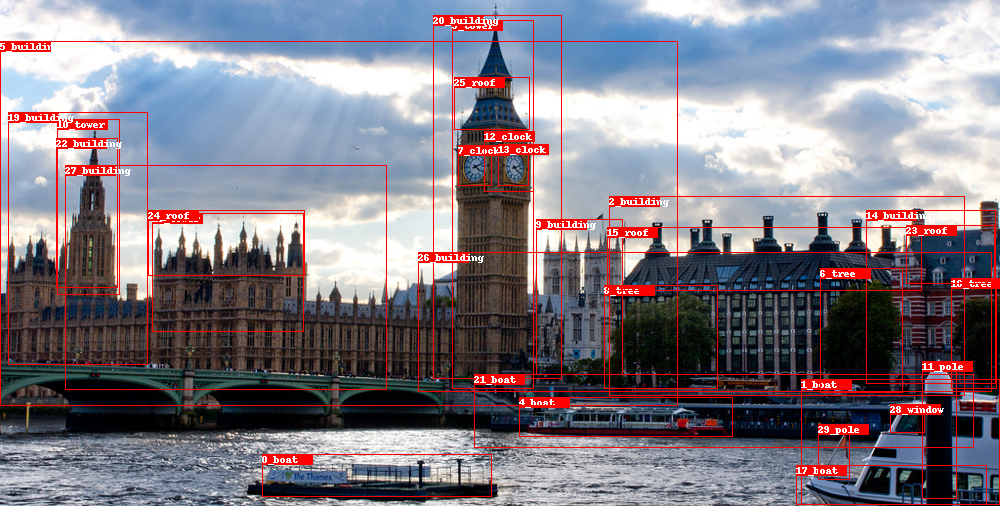

**************************************************
box_labels 0: boat; score: 0.8034903407096863
box_labels 1: boat; score: 0.7846255302429199
box_labels 2: building; score: 0.6615033745765686
box_labels 3: tower; score: 0.6153239607810974
box_labels 4: boat; score: 0.555273711681366
box_labels 5: building; score: 0.4404418170452118
box_labels 6: tree; score: 0.42978787422180176
box_labels 7: clock; score: 0.3902634084224701
box_labels 8: tree; score: 0.38831257820129395
box_labels 9: building; score: 0.3030111789703369
box_labels 10: tower; score: 0.2339676171541214
box_labels 11: pole; score: 0.21917442977428436
box_labels 12: clock; score: 0.21336007118225098
box_labels 13: clock; score: 0.16086088120937347
box_labels 14: building; score: 0.14544200897216797
box_labels 15: roof; score: 0.12269815802574158
box_labels 16: tree; score: 0.10486391186714172
box_labels 17: boat; score: 0.09868703782558441
box_labels 18: tower; score: 0.08570794016122818
box_labels 19: building; score: 0.0

In [48]:
image_path = custom_data_info['idx_to_files'][image_idx]
boxes = custom_prediction[str(image_idx)]['bbox'][:box_topk]
box_labels = custom_prediction[str(image_idx)]['bbox_labels'][:box_topk]
box_scores = custom_prediction[str(image_idx)]['bbox_scores'][:box_topk]
all_rel_labels = custom_prediction[str(image_idx)]['rel_labels']
all_rel_scores = custom_prediction[str(image_idx)]['rel_scores']
all_rel_pairs = custom_prediction[str(image_idx)]['rel_pairs']

for i in range(len(box_labels)):
    box_labels[i] = ind_to_classes[box_labels[i]]

rel_labels = []
rel_scores = []
for i in range(len(all_rel_pairs)):
    if all_rel_pairs[i][0] < box_topk and all_rel_pairs[i][1] < box_topk:
        rel_scores.append(all_rel_scores[i])
        label = str(all_rel_pairs[i][0]) + '_' + box_labels[all_rel_pairs[i][0]] + ' => ' + ind_to_predicates[all_rel_labels[i]] + ' => ' + str(all_rel_pairs[i][1]) + '_' + box_labels[all_rel_pairs[i][1]]
        rel_labels.append(label)

rel_labels = rel_labels[:rel_topk]
rel_scores = rel_scores[:rel_topk]

draw_image(image_path, boxes, box_labels, rel_labels, box_scores=box_scores, rel_scores=rel_scores)

# Step 2

## Run USGG on the COCO dataset

In [1]:
! wget http://images.cocodataset.org/zips/train2017.zip

--2021-05-01 13:20:26--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.153.172
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.153.172|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train2017.zip       100%[===================>]  18.01G  60.3MB/s    in 6m 20s  

2021-05-01 13:26:47 (48.5 MB/s) - ‘train2017.zip’ saved [19336861798/19336861798]



In [3]:
! ls train2017.zip

train2017.zip


In [4]:
! unzip train2017.zip

Archive:  train2017.zip
   creating: train2017/
 extracting: train2017/000000147328.jpg  
 extracting: train2017/000000414738.jpg  
 extracting: train2017/000000281563.jpg  
 extracting: train2017/000000063879.jpg  
 extracting: train2017/000000531349.jpg  
 extracting: train2017/000000340329.jpg  
 extracting: train2017/000000182236.jpg  
 extracting: train2017/000000326820.jpg  
 extracting: train2017/000000149364.jpg  
 extracting: train2017/000000166598.jpg  
 extracting: train2017/000000424792.jpg  
 extracting: train2017/000000178388.jpg  
 extracting: train2017/000000568154.jpg  
 extracting: train2017/000000268150.jpg  
 extracting: train2017/000000138473.jpg  
 extracting: train2017/000000382699.jpg  
 extracting: train2017/000000493952.jpg  
 extracting: train2017/000000348522.jpg  
 extracting: train2017/000000066862.jpg  
 extracting: train2017/000000024457.jpg  
 extracting: train2017/000000160437.jpg  
 extracting: train2017/000000487414.jpg  
 extracting: train2017/00000

In [12]:
ls /home/test_pc/downsample_coco/images/train | wc -l

7077


In [18]:
7077 / 2300

3.0769565217391306

In [21]:
! ls /home/test_pc/downsample_coco/images
! ls /home/test_pc/downsample_coco/images/train_1/ | wc -l

test  train  train_1  train_2  train_3	val
2359


In [23]:
! ls /home/test_pc/Scene-Graph/Scene/checkpoint/
! mkdir -p /home/test_pc/Scene-Graph/Scene/checkpoint/coco
! mkdir -p /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_1
! mkdir -p /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_2
! mkdir -p /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_3

caltech_output		 custom_output_path  pretrained_faster_rcnn
causal-motif-sgdet-exmp  DETECTED_SGG_DIR    WiderPerson
CrowdHuman		 eurocity


In [28]:
%cd Scene/
! ls

/home/test_pc/Scene-Graph/Scene
ABSTRACTIONS.md     docker			 Setup.ipynb
build		    glove			 setup.py
checkpoint	    INSTALL.md			 test1.sh
cmd.cache	    LICENSE			 tests
CODE_OF_CONDUCT.md  maskrcnn_benchmark		 test.sh
configs		    maskrcnn_benchmark.egg-info  tools
DATASET.md	    METRICS.md			 TROUBLESHOOTING.md
datasets	    README.md			 visualization
demo		    requirements.txt


In [ ]:
! CUDA_VISIBLE_DEVICES=0 python -m torch.distributed.launch --master_port 10028 --nproc_per_node=1 tools/relation_test_net.py --config-file "configs/e2e_relation_X_101_32_8_FPN_1x.yaml" MODEL.ROI_RELATION_HEAD.USE_GT_BOX False MODEL.ROI_RELATION_HEAD.USE_GT_OBJECT_LABEL False MODEL.ROI_RELATION_HEAD.PREDICTOR CausalAnalysisPredictor MODEL.ROI_RELATION_HEAD.CAUSAL.EFFECT_TYPE TDE MODEL.ROI_RELATION_HEAD.CAUSAL.FUSION_TYPE sum MODEL.ROI_RELATION_HEAD.CAUSAL.CONTEXT_LAYER motifs  TEST.IMS_PER_BATCH 1 DTYPE "float16" GLOVE_DIR glove MODEL.PRETRAINED_DETECTOR_CKPT /home/test_pc/Scene-Graph/Scene/checkpoint/causal-motif-sgdet-exmp OUTPUT_DIR /home/test_pc/Scene-Graph/Scene/checkpoint/causal-motif-sgdet-exmp TEST.CUSTUM_EVAL True TEST.CUSTUM_PATH /home/test_pc/downsample_coco/images/train_1 DETECTED_SGG_DIR /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_1

2021-05-01 14:46:06,603 maskrcnn_benchmark INFO: Using 1 GPUs
2021-05-01 14:46:06,603 maskrcnn_benchmark INFO: AMP_VERBOSE: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST: ('VG_stanford_filtered_with_attribute_test',)
  TRAIN: ('VG_stanford_filtered_with_attribute_train',)
  VAL: ('VG_stanford_filtered_with_attribute_val',)
DETECTED_SGG_DIR: /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_1
DTYPE: float16
GLOVE_DIR: glove
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1000
  MAX_SIZE_TRAIN: 1000
  MIN_SIZE_TEST: 600
  MIN_SIZE_TRAIN: (600,)
  PIXEL_MEAN: [102.9801, 115.9465, 122.7717]
  PIXEL_STD: [1.0, 1.0, 1.0]
  SATURATION: 0.0
  TO_BGR255: True
  VERTICAL_FLIP_PROB_TRAIN: 0.0
MODEL:
  ATTRIBUTE_ON: False
  BACKBONE:
    CONV_BODY: R-101-FPN
    FREEZE_CONV_BODY_AT: 2
  CLS_AGNOSTIC_BBOX_REG: False
  DEVICE: cuda
  FBNET:
    ARCH: default
    ARCH_DEF: 
    BN_TYPE: bn
    DET_HEAD_BLOCKS: []
   

In [34]:
!nvidia-smi

Sat May  1 18:00:03 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.06    Driver Version: 450.51.06    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  On   | 00000000:02:00.0 Off |                    0 |
| N/A   52C    P0    31W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla P100-PCIE...  On   | 00000000:84:00.0 Off |                    0 |
| N/A   

In [35]:
! CUDA_VISIBLE_DEVICES=0 python -m torch.distributed.launch --master_port 10028 --nproc_per_node=1 tools/relation_test_net.py --config-file "configs/e2e_relation_X_101_32_8_FPN_1x.yaml" MODEL.ROI_RELATION_HEAD.USE_GT_BOX False MODEL.ROI_RELATION_HEAD.USE_GT_OBJECT_LABEL False MODEL.ROI_RELATION_HEAD.PREDICTOR CausalAnalysisPredictor MODEL.ROI_RELATION_HEAD.CAUSAL.EFFECT_TYPE TDE MODEL.ROI_RELATION_HEAD.CAUSAL.FUSION_TYPE sum MODEL.ROI_RELATION_HEAD.CAUSAL.CONTEXT_LAYER motifs  TEST.IMS_PER_BATCH 1 DTYPE "float16" GLOVE_DIR glove MODEL.PRETRAINED_DETECTOR_CKPT /home/test_pc/Scene-Graph/Scene/checkpoint/causal-motif-sgdet-exmp OUTPUT_DIR /home/test_pc/Scene-Graph/Scene/checkpoint/causal-motif-sgdet-exmp TEST.CUSTUM_EVAL True TEST.CUSTUM_PATH /home/test_pc/downsample_coco/images/train_2 DETECTED_SGG_DIR /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_2

2021-05-01 18:00:40,994 maskrcnn_benchmark INFO: Using 1 GPUs
2021-05-01 18:00:40,994 maskrcnn_benchmark INFO: AMP_VERBOSE: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST: ('VG_stanford_filtered_with_attribute_test',)
  TRAIN: ('VG_stanford_filtered_with_attribute_train',)
  VAL: ('VG_stanford_filtered_with_attribute_val',)
DETECTED_SGG_DIR: /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_2
DTYPE: float16
GLOVE_DIR: glove
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1000
  MAX_SIZE_TRAIN: 1000
  MIN_SIZE_TEST: 600
  MIN_SIZE_TRAIN: (600,)
  PIXEL_MEAN: [102.9801, 115.9465, 122.7717]
  PIXEL_STD: [1.0, 1.0, 1.0]
  SATURATION: 0.0
  TO_BGR255: True
  VERTICAL_FLIP_PROB_TRAIN: 0.0
MODEL:
  ATTRIBUTE_ON: False
  BACKBONE:
    CONV_BODY: R-101-FPN
    FREEZE_CONV_BODY_AT: 2
  CLS_AGNOSTIC_BBOX_REG: False
  DEVICE: cuda
  FBNET:
    ARCH: default
    ARCH_DEF: 
    BN_TYPE: bn
    DET_HEAD_BLOCKS: []
   

In [36]:
! CUDA_VISIBLE_DEVICES=0 python -m torch.distributed.launch --master_port 10028 --nproc_per_node=1 tools/relation_test_net.py --config-file "configs/e2e_relation_X_101_32_8_FPN_1x.yaml" MODEL.ROI_RELATION_HEAD.USE_GT_BOX False MODEL.ROI_RELATION_HEAD.USE_GT_OBJECT_LABEL False MODEL.ROI_RELATION_HEAD.PREDICTOR CausalAnalysisPredictor MODEL.ROI_RELATION_HEAD.CAUSAL.EFFECT_TYPE TDE MODEL.ROI_RELATION_HEAD.CAUSAL.FUSION_TYPE sum MODEL.ROI_RELATION_HEAD.CAUSAL.CONTEXT_LAYER motifs  TEST.IMS_PER_BATCH 1 DTYPE "float16" GLOVE_DIR glove MODEL.PRETRAINED_DETECTOR_CKPT /home/test_pc/Scene-Graph/Scene/checkpoint/causal-motif-sgdet-exmp OUTPUT_DIR /home/test_pc/Scene-Graph/Scene/checkpoint/causal-motif-sgdet-exmp TEST.CUSTUM_EVAL True TEST.CUSTUM_PATH /home/test_pc/downsample_coco/images/train_3 DETECTED_SGG_DIR /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_3

2021-05-01 20:20:42,678 maskrcnn_benchmark INFO: Using 1 GPUs
2021-05-01 20:20:42,678 maskrcnn_benchmark INFO: AMP_VERBOSE: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST: ('VG_stanford_filtered_with_attribute_test',)
  TRAIN: ('VG_stanford_filtered_with_attribute_train',)
  VAL: ('VG_stanford_filtered_with_attribute_val',)
DETECTED_SGG_DIR: /home/test_pc/Scene-Graph/Scene/checkpoint/coco/train_3
DTYPE: float16
GLOVE_DIR: glove
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1000
  MAX_SIZE_TRAIN: 1000
  MIN_SIZE_TEST: 600
  MIN_SIZE_TRAIN: (600,)
  PIXEL_MEAN: [102.9801, 115.9465, 122.7717]
  PIXEL_STD: [1.0, 1.0, 1.0]
  SATURATION: 0.0
  TO_BGR255: True
  VERTICAL_FLIP_PROB_TRAIN: 0.0
MODEL:
  ATTRIBUTE_ON: False
  BACKBONE:
    CONV_BODY: R-101-FPN
    FREEZE_CONV_BODY_AT: 2
  CLS_AGNOSTIC_BBOX_REG: False
  DEVICE: cuda
  FBNET:
    ARCH: default
    ARCH_DEF: 
    BN_TYPE: bn
    DET_HEAD_BLOCKS: []
   

In [1]:
%pycat /home/test_pc/Scene-Graph/Scene/checkpoint/eurocity/amsterdam_day/custom_data_info.json

In [1]:
! python -V

Python 3.6.5


In [21]:
import torch
import json
import h5py
import random
import numpy as np
from matplotlib.pyplot import imshow
from PIL import Image, ImageDraw

In [3]:
custom_prediction = json.load(open('/home/test_pc/Scene-Graph/Scene/checkpoint/eurocity/amsterdam_day/custom_prediction.json'))
custom_data_info = json.load(open('/home/test_pc/Scene-Graph/Scene/checkpoint/eurocity/amsterdam_day/custom_data_info.json'))

In [19]:
def draw_single_box(pic, box, color='red', draw_info=None):
    draw = ImageDraw.Draw(pic)
    x1,y1,x2,y2 = int(box[0]), int(box[1]), int(box[2]), int(box[3])
    draw.rectangle(((x1, y1), (x2, y2)), outline=color)
    if draw_info:
        draw.rectangle(((x1, y1), (x1+50, y1+10)), fill=color)
        info = draw_info
        draw.text((x1, y1), info)
        
def print_list(name, input_list, scores=None):
    for i, item in enumerate(input_list):
        if scores == None:
            print(name + ' ' + str(i) + ': ' + str(item))
        else:
            print(name + ' ' + str(i) + ': ' + str(item) + '; score: ' + str(scores[i]))
    
def draw_image(img_path, boxes, box_labels, rel_labels, box_scores=None, rel_scores=None):
    size = get_size(Image.open(img_path).size)
    pic = Image.open(img_path).resize(size)
    num_obj = len(boxes)
    for i in range(num_obj):
        info = str(i) + '_' + box_labels[i]
        draw_single_box(pic, boxes[i], draw_info=info)
    display(pic)
    print('*' * 50)
    print_list('box_labels', box_labels, box_scores)
    print('*' * 50)
    print_list('rel_labels', rel_labels, rel_scores)
    
    return None

def get_size(image_size):
    min_size = 600
    max_size = 1000
    w, h = image_size
    size = min_size
    if max_size is not None:
        min_original_size = float(min((w, h)))
        max_original_size = float(max((w, h)))
        if max_original_size / min_original_size * size > max_size:
            size = int(round(max_size * min_original_size / max_original_size))
    if (w <= h and w == size) or (h <= w and h == size):
        return (w, h)
    if w < h:
        ow = size
        oh = int(size * h / w)
    else:
        oh = size
        ow = int(size * w / h)
    return (ow, oh)

In [7]:
# parameters
image_idx = 500
box_topk = 30 # select top k bounding boxes
rel_topk = 20 # select top k relationships
ind_to_classes = custom_data_info['ind_to_classes']
ind_to_predicates = custom_data_info['ind_to_predicates']

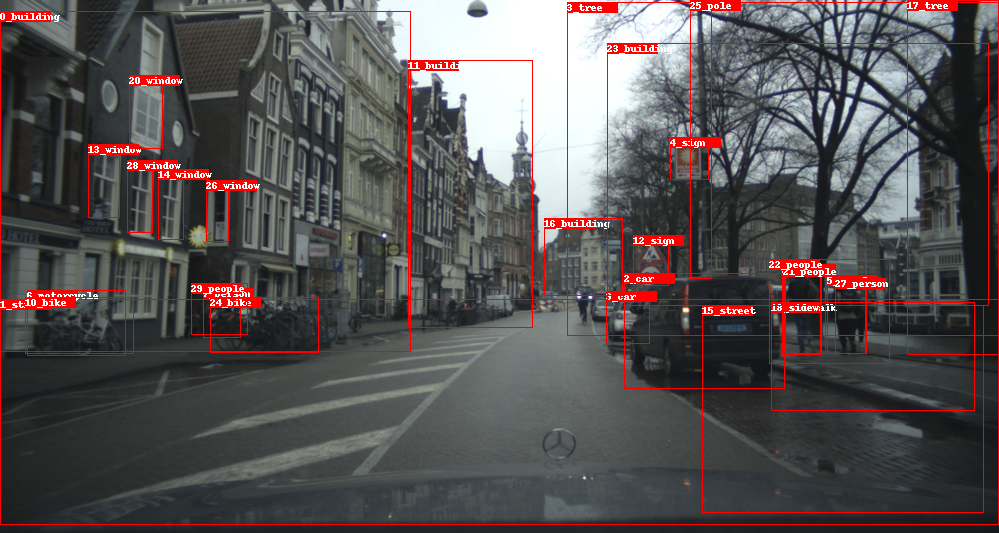

**************************************************
box_labels 0: building; score: 0.7136980295181274
box_labels 1: street; score: 0.6902559995651245
box_labels 2: car; score: 0.5758141875267029
box_labels 3: tree; score: 0.4452665150165558
box_labels 4: sign; score: 0.43659207224845886
box_labels 5: people; score: 0.3987698256969452
box_labels 6: motorcycle; score: 0.32932746410369873
box_labels 7: person; score: 0.30551576614379883
box_labels 8: person; score: 0.2651764154434204
box_labels 9: car; score: 0.24004997313022614
box_labels 10: bike; score: 0.23576734960079193
box_labels 11: building; score: 0.22235822677612305
box_labels 12: sign; score: 0.19879688322544098
box_labels 13: window; score: 0.19668932259082794
box_labels 14: window; score: 0.1788519322872162
box_labels 15: street; score: 0.14893712103366852
box_labels 16: building; score: 0.1477053016424179
box_labels 17: tree; score: 0.14728499948978424
box_labels 18: sidewalk; score: 0.1381380259990692
box_labels 19: man; sc

In [8]:
image_path = custom_data_info['idx_to_files'][image_idx]
boxes = custom_prediction[str(image_idx)]['bbox'][:box_topk]
box_labels = custom_prediction[str(image_idx)]['bbox_labels'][:box_topk]
box_scores = custom_prediction[str(image_idx)]['bbox_scores'][:box_topk]
all_rel_labels = custom_prediction[str(image_idx)]['rel_labels']
all_rel_scores = custom_prediction[str(image_idx)]['rel_scores']
all_rel_pairs = custom_prediction[str(image_idx)]['rel_pairs']

for i in range(len(box_labels)):
    box_labels[i] = ind_to_classes[box_labels[i]]

rel_labels = []
rel_scores = []
for i in range(len(all_rel_pairs)):
    if all_rel_pairs[i][0] < box_topk and all_rel_pairs[i][1] < box_topk:
        rel_scores.append(all_rel_scores[i])
        label = str(all_rel_pairs[i][0]) + '_' + box_labels[all_rel_pairs[i][0]] + ' => ' + ind_to_predicates[all_rel_labels[i]] + ' => ' + str(all_rel_pairs[i][1]) + '_' + box_labels[all_rel_pairs[i][1]]
        rel_labels.append(label)

rel_labels = rel_labels[:rel_topk]
rel_scores = rel_scores[:rel_topk]

draw_image(image_path, boxes, box_labels, rel_labels, box_scores=box_scores, rel_scores=rel_scores)

# Step 3
### Insert and filter data from json file to sqlite

In [1]:
import os
import json
from glob import glob

In [2]:
import sqlite3
from sqlite3 import Error


def create_connection(db_file):
    """ create a database connection to the SQLite database
        specified by db_file
    :param db_file: database file
    :return: Connection object or None
    """
    conn = None
    try:
        conn = sqlite3.connect(db_file)
        return conn
    except Error as e:
        print(e)

    return conn


def create_table(conn, create_table_sql):
    """ create a table from the create_table_sql statement
    :param conn: Connection object
    :param create_table_sql: a CREATE TABLE statement
    :return:
    """
    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Error as e:
        print(e)


def sqlite_main():
    database = r"person.db"

    sql_create_images_table = """ CREATE TABLE IF NOT EXISTS images (
                                        id integer PRIMARY KEY,
                                        dataset_name text NOT NULL,
                                        image_name text NOT NULL,
                                        rel_flag BOOLEAN NOT NULL CHECK (rel_flag IN (0,1))
                                    ); """

    sql_create_objects_table = """CREATE TABLE IF NOT EXISTS objects (
                                    id integer PRIMARY KEY,
                                    object_name text NOT NULL,
                                    score real NOT NULL,
                                    dataset_name text NOT NULL,
                                    image_name text NOT NULL,
                                    image_id integer NOT NULL,
                                    FOREIGN KEY (image_id) REFERENCES images (id)
                                );"""
    

    sql_create_relations_table = """CREATE TABLE IF NOT EXISTS relations (
                                    id integer PRIMARY KEY,
                                    object_1 text NOT NULL,
                                    relation text NOT NULL,
                                    object_2 text NOT NULL,
                                    relation_score real NOT NULL,
                                    object1_score real NOT NULL,
                                    object2_score real NOT NULL,
                                    dataset_name text NOT NULL,
                                    image_name text NOT NULL,
                                    image_id integer NOT NULL,
                                    FOREIGN KEY (image_id) REFERENCES images (id)
                                );"""


    # create a database connection
    conn = create_connection(database)
    
    # create tables
    if conn is not None:
        # create images table
        create_table(conn, sql_create_images_table)
    
        # create objects table
        create_table(conn, sql_create_objects_table)
    
        # create relations table
        create_table(conn, sql_create_relations_table)
    else:
        print("Error! cannot create the database connection.")

sqlite_main()

In [3]:
import sqlite3
from sqlite3 import Error


def create_connection(db_file):
    """ create a database connection to the SQLite database
        specified by db_file
    :param db_file: database file
    :return: Connection object or None
    """
    conn = None
    try:
        conn = sqlite3.connect(db_file)
    except Error as e:
        print(e)

    return conn


def insert_image(conn, image):
    """
    Create a new project into the projects table
    :param conn:
    :param image:
    :return: image id
    """
    sql = ''' INSERT INTO images(dataset_name, image_name,rel_flag)
              VALUES(?,?,?) '''
    cur = conn.cursor()
    cur.execute(sql, image)
    conn.commit()
    return cur.lastrowid


def insert_object(conn, _object):
    """
    Create a new object
    :param conn:
    :param object:
    :return:
    """

    sql = ''' INSERT INTO objects(object_name,score,dataset_name,image_name,image_id)
              VALUES(?,?,?,?,?) '''
    cur = conn.cursor()
    cur.execute(sql, _object)
    conn.commit()
    return cur.lastrowid


def insert_relation(conn, _rel):
    """
    Create a new relation
    :param conn:
    :param _rel:
    :return:
    """

    sql = ''' INSERT INTO relations(object_1,relation,object_2,relation_score,object1_score,object2_score,dataset_name,image_name,image_id)
              VALUES(?,?,?,?,?,?,?,?,?) '''
    cur = conn.cursor()
    cur.execute(sql, _rel)
    conn.commit()
    return cur.lastrowid



In [4]:
def insert_data(data_dir, e_check, dataset='Eurocity'):
    database = r"person.db"
    # create a database connection
    conn = create_connection(database)
    
    box_topk = 30  # select top k bounding boxes
    rel_topk = 20  # select top k relationships

    for d in data_dir:

        print(f"we are trying to filter prediction for {d}")

        info_path = os.path.join(e_check, d, 'custom_data_info.json')
        prediction_file = os.path.join(e_check, d, 'custom_prediction.json')
        custom_prediction = json.load(open(prediction_file))
        custom_data_info = json.load(open(info_path))

        ind_to_classes = custom_data_info['ind_to_classes']
        ind_to_predicates = custom_data_info['ind_to_predicates']

        human_labels = ['woman', 'men', 'boy', 'kid', 'child', 'guy', 'man', 'person', 'girl', 'lady', 'people']

        for image_idx in range(len(custom_data_info['idx_to_files'])):
            file_name, _ = os.path.basename(custom_data_info['idx_to_files'][image_idx]).rsplit(".")
            image_path = custom_data_info['idx_to_files'][image_idx]
            boxes = custom_prediction[str(image_idx)]['bbox'][:box_topk]
            box_labels = custom_prediction[str(image_idx)]['bbox_labels'][:box_topk]
            box_scores = custom_prediction[str(image_idx)]['bbox_scores'][:box_topk]
            all_rel_labels = custom_prediction[str(image_idx)]['rel_labels']
            all_rel_scores = custom_prediction[str(image_idx)]['rel_scores']
            all_rel_pairs = custom_prediction[str(image_idx)]['rel_pairs']

            for i in range(len(box_labels)):
                box_labels[i] = ind_to_classes[box_labels[i]]

            rel_labels_list = []
            rel_scores = []

            new_rel_pairs = []
            new_rel_labels = []
            new_rel_scores = []

            for i in range(len(all_rel_pairs)):
                if all_rel_pairs[i][0] < box_topk and all_rel_pairs[i][1] < box_topk:
                    if box_labels[all_rel_pairs[i][0]] in human_labels or box_labels[all_rel_pairs[i][1]] in human_labels:
#                       label = str(all_rel_pairs[i][0]) + '_' + box_labels[all_rel_pairs[i][0]] + ' => ' + ind_to_predicates[all_rel_labels[i]] + ' => ' + str(all_rel_pairs[i][1]) + '_' + box_labels[all_rel_pairs[i][1]]
                        new_rel_pairs.append(all_rel_pairs[i])
                        new_rel_labels.append(all_rel_labels[i])
                        new_rel_scores.append(all_rel_scores[i])

            h_flag = False
            new_rel_scores = new_rel_scores[:rel_topk]
            new_rel_pairs = new_rel_pairs[:rel_topk]
            new_rel_labels = new_rel_labels[:rel_topk]
            for i in range(len(new_rel_pairs)):
                if new_rel_pairs[i][0] < box_topk and new_rel_pairs[i][1] < box_topk:
                    if box_labels[new_rel_pairs[i][0]] in human_labels or box_labels[new_rel_pairs[i][1]] in human_labels:
                        h_flag = True
                    r_list = [box_labels[new_rel_pairs[i][0]], ind_to_predicates[new_rel_labels[i]],
                              box_labels[new_rel_pairs[i][1]], box_scores[new_rel_pairs[i][0]],
                              box_scores[new_rel_pairs[i][1]]
                             ]
                    rel_labels_list.append(r_list)

#             print(rel_labels_list)
#             print(new_rel_scores)
#             print(box_labels)
#             print(box_scores)
            if h_flag:
                rel_flag = '1'
            else:
                rel_flag = '0'

            image_ = (dataset, file_name, rel_flag)
#             print(image_)
#             image_id = 0
            image_id = insert_image(conn, image_)

            for idx, _obj in enumerate(box_labels):
                obj_tuples = (_obj, box_scores[idx], dataset, file_name, image_id)
#                 print(obj_tuples)
                insert_object(conn, obj_tuples)

            # relations
            for idx, rel in enumerate(rel_labels_list):
                rel_ = (rel[0], rel[1], rel[2], new_rel_scores[idx], rel[3], rel[4], dataset, file_name, image_id)
#                 print(rel_)
                insert_relation(conn, rel_)
#             if h_flag:
#                 break
#         break

In [5]:
e_check = "/home/test_pc/Scene-Graph/Scene/checkpoint/coco"

e_image_dir = glob(f"{e_check}/*")
train_dir_name = [x.rsplit("/", 1)[1] for x in e_image_dir]
print(train_dir_name)

insert_data(train_dir_name, e_check, dataset='COCO')

['train_2', 'train_1', 'train_3']
we are trying to filter prediction for train_2
we are trying to filter prediction for train_1
we are trying to filter prediction for train_3


In [9]:
e_check = "/home/test_pc/Scene-Graph/Scene/checkpoint/eurocity"

e_image_dir = glob(f"{e_check}/*")
train_dir_name = [x.rsplit("/", 1)[1] for x in e_image_dir]
# print(train_dir_name)

insert_data(train_dir_name, e_check, dataset='Eurocity')


we are trying to filter prediction for ljubljana_day
we are trying to filter prediction for potsdam_day
we are trying to filter prediction for marseille_day
we are trying to filter prediction for hamburg_day
we are trying to filter prediction for firenze_day
we are trying to filter prediction for nuernberg_day
we are trying to filter prediction for dresden_day
we are trying to filter prediction for szczecin_day
we are trying to filter prediction for amsterdam_day
we are trying to filter prediction for brno_day
we are trying to filter prediction for barcelona_day
we are trying to filter prediction for roma_day
we are trying to filter prediction for prague_day
we are trying to filter prediction for budapest_day
we are trying to filter prediction for stuttgart_day
we are trying to filter prediction for pisa_day
we are trying to filter prediction for wuerzburg_day
we are trying to filter prediction for zagreb_day
we are trying to filter prediction for torino_day
we are trying to filter pre

In [6]:
# check_data
e_check = "/home/test_pc/Scene-Graph/Scene/checkpoint/eurocity"

e_image_dir = glob(f"{e_check}/*")
train_dir_name = [x.rsplit("/", 1)[1] for x in e_image_dir]
# print(train_dir_name)

check_data(train_dir_name, e_check, dataset='Eurocity')


we are trying to filter prediction for ljubljana_day
('Eurocity', 'ljubljana_00599', '0')
('car', 0.8391796946525574, 'Eurocity', 'ljubljana_00599', 0)
('car', 0.8129258751869202, 'Eurocity', 'ljubljana_00599', 0)
('building', 0.6957226395606995, 'Eurocity', 'ljubljana_00599', 0)
('car', 0.6710112690925598, 'Eurocity', 'ljubljana_00599', 0)
('car', 0.6644753217697144, 'Eurocity', 'ljubljana_00599', 0)
('building', 0.6599908471107483, 'Eurocity', 'ljubljana_00599', 0)
('street', 0.572593629360199, 'Eurocity', 'ljubljana_00599', 0)
('car', 0.5186793804168701, 'Eurocity', 'ljubljana_00599', 0)
('building', 0.5153779983520508, 'Eurocity', 'ljubljana_00599', 0)
('window', 0.4156506359577179, 'Eurocity', 'ljubljana_00599', 0)
('window', 0.3839051127433777, 'Eurocity', 'ljubljana_00599', 0)
('window', 0.35268473625183105, 'Eurocity', 'ljubljana_00599', 0)
('window', 0.32644158601760864, 'Eurocity', 'ljubljana_00599', 0)
('pole', 0.2662825882434845, 'Eurocity', 'ljubljana_00599', 0)
('tire', 0

KeyboardInterrupt: 

In [ ]:
e_check = "/home/test_pc/Scene-Graph/Scene/checkpoint/caltech_output"

e_image_dir = glob(f"{e_check}/*")
train_dir_name = [x.rsplit("/", 1)[1] for x in e_image_dir]
print(train_dir_name)

insert_data(train_dir_name, e_check, dataset='Caltech')


In [13]:
! ls "/home/test_pc/Scene-Graph/Scene/checkpoint/custom_output_path"

custom_data_info.json  custom_prediction.json


In [14]:
e_check = "/home/test_pc/Scene-Graph/Scene/checkpoint"
train_dir_name = ["custom_output_path"]
insert_data(train_dir_name, e_check, dataset='CityPerson')

we are trying to filter prediction for custom_output_path


In [15]:
e_check = "/home/test_pc/Scene-Graph/Scene/checkpoint/CrowdHuman"

e_image_dir = glob(f"{e_check}/*")
train_dir_name = [x.rsplit("/", 1)[1] for x in e_image_dir]
print(train_dir_name)

insert_data(train_dir_name, e_check, dataset='CrowdHuman')

['train_2', 'train_5', 'train_4', 'train_1', 'train_3']
we are trying to filter prediction for train_2
we are trying to filter prediction for train_5
we are trying to filter prediction for train_4
we are trying to filter prediction for train_1
we are trying to filter prediction for train_3


In [16]:
e_check = "/home/test_pc/Scene-Graph/Scene/checkpoint/WiderPerson"

e_image_dir = glob(f"{e_check}/*")
train_dir_name = [x.rsplit("/", 1)[1] for x in e_image_dir]
print(train_dir_name)

insert_data(train_dir_name, e_check, dataset='WiderPerson')

['train_2', 'train_1', 'train_3']
we are trying to filter prediction for train_2
we are trying to filter prediction for train_1
we are trying to filter prediction for train_3


In [19]:
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()


cur.execute("SELECT id, count(*) FROM images GROUP BY id  ORDER BY count(*) DESC")

rows = cur.fetchall()


table = []
head = ["id", "Count"]

for row in rows:
    table.append(row)

all_images_df = pd.DataFrame(table, columns=head) 

In [20]:
all_images_df['Count'].sum()

54153

In [18]:
import pandas as pd
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()


cur.execute("SELECT id, count(*) FROM images GROUP BY id  ORDER BY count(*) DESC")

rows = cur.fetchall()


table = []
head = ["id", "Count"]

for row in rows:
    table.append(row)

all_images_df = pd.DataFrame(table, columns=head) 
all_images_df['Count'].sum()

54153

# Step 4 

### Augment dataset

You can download the db file from this address and go dir

In [2]:
import json
import pandas as pd
from tqdm import tqdm_notebook
from IPython.display import HTML, display
import tabulate
import sqlite3
from sqlite3 import Error
import random
import copy
import math


human_labels = ('woman', 'men', 'boy', 'kid', 'child', 'guy', 'man', 'person', 'girl', 'lady', 'people')

In [3]:
def create_connection(db_file):
    """ create a database connection to the SQLite database
        specified by db_file
    :param db_file: database file
    :return: Connection object or None
    """
    conn = None
    try:
        conn = sqlite3.connect(db_file)
    except Error as e:
        print(e)

    return conn

In [4]:
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()


cur.execute("SELECT object_1,relation,object_2, count(*) FROM relations WHERE dataset_name=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20 GROUP BY object_1,relation,object_2  ORDER BY count(*) DESC", ('Eurocity',))

rows = cur.fetchall()

head = ["Object_1", "Relation", "Object_2", "Count"]
table = []

for row in rows:
    table.append(row)

r_eurocity_df = pd.DataFrame(table, columns =head) 
r_eurocity_df

,Object_1,Relation,Object_2,Count
0,building,behind,man,13315
1,building,behind,person,11261
2,person,walking on,street,8611
3,person,walking on,sidewalk,7407
4,man,walking on,street,6689
...,...,...,...,...
677,woman,watching,boy,1
678,woman,watching,dog,1
679,woman,watching,light,1
680,woman,watching,umbrella,1


In [5]:
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()


cur.execute("SELECT object_name, count(*) FROM objects WHERE dataset_name=? and score > 0.15 GROUP BY object_name  ORDER BY count(*) DESC", ('Eurocity',))

rows = cur.fetchall()

head = ["Objects", "Count"]
table = []

for row in rows:
    table.append(row)

o_eurocity_df = pd.DataFrame(table, columns =head) 
o_eurocity_df

,Objects,Count
0,car,78689
1,building,63717
2,window,37886
3,tree,35842
4,sign,28952
...,...,...
110,phone,1
111,sink,1
112,sock,1
113,surfboard,1


### Create a dataframe for eurocity

In [6]:
r_eurocity_df['images'] = ""
# import json
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()

# rel_dict = dict()

# for index, row in r_eurocity_df.iterrows():
for index, row in tqdm_notebook(r_eurocity_df.iterrows()):
    q_in = ('Eurocity' ,row['Object_1'], row['Relation'], row['Object_2'])
    cur.execute("SELECT image_name FROM relations WHERE dataset_name=? and object_1=? and relation=? and object_2=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20", q_in)
    rows = cur.fetchall()
    t_st = set()
    for r in rows:
        t_st.add(r[0])
    r_eurocity_df.at[index, 'images'] = list(t_st)

r_eurocity_df

/home/test_pc/.pyenv/versions/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:12: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if sys.path[0] == '':


0it [00:00, ?it/s]

,Object_1,Relation,Object_2,Count,images
0,building,behind,man,13315,"[roma_00200, roma_00411, firenze_00045, marsei..."
1,building,behind,person,11261,"[firenze_00047, marseille_00368, roma_00200, r..."
2,person,walking on,street,8611,"[firenze_00047, marseille_00368, budapest_0062..."
3,person,walking on,sidewalk,7407,"[ljubljana_00192, firenze_00047, barcelona_010..."
4,man,walking on,street,6689,"[ljubljana_00192, bologna_00321, dresden_00689..."
...,...,...,...,...,...
677,woman,watching,boy,1,[firenze_00429]
678,woman,watching,dog,1,[milano_00406]
679,woman,watching,light,1,[budapest_00267]
680,woman,watching,umbrella,1,[nuernberg_00039]


In [7]:
im_list = r_eurocity_df.images.to_list()

In [11]:
len(set(im_list[677]))

1

### Create a dataframe for cityperson

In [12]:
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()


cur.execute("SELECT object_1,relation,object_2, count(*) FROM relations WHERE dataset_name=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20 GROUP BY object_1,relation,object_2  ORDER BY count(*) DESC", ('CityPerson',))

rows = cur.fetchall()

head = ["Object_1", "Relation", "Object_2", "Count"]
table = []

for row in rows:
    table.append(row)

r_cityperson_df = pd.DataFrame(table, columns =head) 
r_cityperson_df 

,Object_1,Relation,Object_2,Count
0,building,behind,man,1746
1,building,behind,person,1239
2,person,walking on,sidewalk,1071
3,person,walking on,street,909
4,tree,behind,man,889
...,...,...,...,...
259,woman,looking at,tree,1
260,woman,riding,motorcycle,1
261,woman,sitting on,bench,1
262,woman,sitting on,chair,1


In [13]:

r_cityperson_df['images'] = ""
database = r"person.db"
im_set = set()
# create a database connection
conn = create_connection(database)
cur = conn.cursor()
for index, row in tqdm_notebook(r_cityperson_df.iterrows(), desc ="update the r_cityperson_df"):
    q_in = ('CityPerson' ,row['Object_1'], row['Relation'], row['Object_2'])
    cur.execute("SELECT image_name FROM relations WHERE dataset_name=? and object_1=? and relation=? and object_2=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20", q_in)
    rows = cur.fetchall()
    t_st = set()
    for r in rows:
        t_st.add(r[0])
        im_set.add(r[0])
#         for el in r:
#             im_set.add(el)
    r_cityperson_df.at[index, 'images'] = list(t_st)

r_cityperson_df
# len(im_set)

/home/test_pc/.pyenv/versions/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


update the r_cityperson_df: 0it [00:00, ?it/s]

,Object_1,Relation,Object_2,Count,images
0,building,behind,man,1746,"[zurich_000079_000019_leftImg8bit, zurich_0000..."
1,building,behind,person,1239,"[zurich_000079_000019_leftImg8bit, krefeld_000..."
2,person,walking on,sidewalk,1071,"[zurich_000074_000019_leftImg8bit, erfurt_0000..."
3,person,walking on,street,909,"[weimar_000017_000019_leftImg8bit, erfurt_0000..."
4,tree,behind,man,889,"[hamburg_000000_091038_leftImg8bit, hamburg_00..."
...,...,...,...,...,...
259,woman,looking at,tree,1,[bochum_000000_009554_leftImg8bit]
260,woman,riding,motorcycle,1,[dusseldorf_000165_000019_leftImg8bit]
261,woman,sitting on,bench,1,[hamburg_000000_098061_leftImg8bit]
262,woman,sitting on,chair,1,[hamburg_000000_052122_leftImg8bit]


### Create a dataframe for crowdhuman

In [14]:
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()


cur.execute("SELECT object_1,relation,object_2, count(*) FROM relations WHERE dataset_name=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20 GROUP BY object_1,relation,object_2  ORDER BY count(*) DESC", ('CrowdHuman',))

rows = cur.fetchall()

head = ["Object_1", "Relation", "Object_2", "Count"]
table = []

for row in rows:
    table.append(row)

r_crowdhuman_df = pd.DataFrame(table, columns =head) 
# crowdhuman_df 

In [15]:
r_crowdhuman_df['images'] = ""
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()
for index, row in tqdm_notebook(r_crowdhuman_df.iterrows(), desc ="update the r_cityperson_df"):
    q_in = ('CrowdHuman' ,row['Object_1'], row['Relation'], row['Object_2'])
    cur.execute("SELECT image_name FROM relations WHERE dataset_name=? and object_1=? and relation=? and object_2=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20", q_in)
    rows = cur.fetchall()
    t_st = set()
    for r in rows:
        t_st.add(r[0])
    r_crowdhuman_df.at[index, 'images'] = list(t_st)

r_crowdhuman_df

/home/test_pc/.pyenv/versions/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


update the r_cityperson_df: 0it [00:00, ?it/s]

,Object_1,Relation,Object_2,Count,images
0,man,watching,man,12330,"[273275,88e94000c3c427a5, 283991,15e2f0000e236..."
1,building,behind,man,8428,"[273275,88e94000c3c427a5, 283991,15e2f0000e236..."
2,person,watching,man,7706,"[283991,15e2f0000e23684b, 283991,1d5d80001be0b..."
3,building,behind,woman,7382,"[283991,15e2f0000e23684b, 283991,1d5d80001be0b..."
4,man,wearing,shirt,6885,"[283647,13eb000ab0293c4, 273275,137b82000bce8b..."
...,...,...,...,...,...
834,woman,watching,people,1,"[282555,462140001dbfe739]"
835,woman,watching,sheep,1,"[273275,3e5f000747f9295]"
836,woman,watching,tail,1,"[273278,34dfc00090520457]"
837,woman,wearing,logo,1,"[273271,69a80006c4e599f]"


### Create a dataframe for widerperson

In [16]:
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()


cur.execute("SELECT object_1,relation,object_2, count(*) FROM relations WHERE dataset_name=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20 GROUP BY object_1,relation,object_2  ORDER BY count(*) DESC", ('WiderPerson',))

rows = cur.fetchall()

head = ["Object_1", "Relation", "Object_2", "Count"]
table = []

for row in rows:
    table.append(row)

r_widerperson_df = pd.DataFrame(table, columns=head) 
r_widerperson_df 

,Object_1,Relation,Object_2,Count
0,man,watching,man,8605
1,person,watching,man,8527
2,person,watching,woman,5479
3,building,behind,man,5058
4,building,behind,woman,4100
...,...,...,...,...
508,woman,in front of,door,1
509,woman,under,umbrella,1
510,woman,watching,animal,1
511,woman,watching,cow,1


In [17]:
r_widerperson_df['images'] = ""
database = r"person.db"

# create a database connection
conn = create_connection(database)
cur = conn.cursor()
for index, row in tqdm_notebook(r_widerperson_df.iterrows(), desc ="update the r_cityperson_df"):
    q_in = ('WiderPerson' ,row['Object_1'], row['Relation'], row['Object_2'])
    cur.execute("SELECT image_name FROM relations WHERE dataset_name=? and object_1=? and relation=? and object_2=? and object1_score > 0.15 and object2_score > 0.15 and relation_score > 0.20", q_in)
    rows = cur.fetchall()
    t_st = set()
    for r in rows:
        t_st.add(r[0])
    r_widerperson_df.at[index, 'images'] = list(t_st)

r_widerperson_df

/home/test_pc/.pyenv/versions/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


update the r_cityperson_df: 0it [00:00, ?it/s]

,Object_1,Relation,Object_2,Count,images
0,man,watching,man,8605,"[017833, 020028, 005389, 003661, 014001, 00125..."
1,person,watching,man,8527,"[020028, 004910, 017137, 012603, 014001, 01931..."
2,person,watching,woman,5479,"[001942, 017137, 004910, 019310, 016087, 01438..."
3,building,behind,man,5058,"[020028, 012603, 005214, 003661, 019310, 01400..."
4,building,behind,woman,4100,"[020028, 003661, 019310, 013034, 016087, 00125..."
...,...,...,...,...,...
508,woman,in front of,door,1,[009452]
509,woman,under,umbrella,1,[010318]
510,woman,watching,animal,1,[016979]
511,woman,watching,cow,1,[013810]


In [18]:
def setA_setB(A, B):
    """
    set A - set B
    """
    common_list = []
    diff_set = []
    comm_set = []
    for idx, row in A.iterrows():
        index_list = B[(B['Object_1'] == row['Object_1'])&(B['Relation'] == row['Relation'])&(B['Object_2'] == row['Object_2'])].index.tolist()
        if not index_list:
           diff_set.append(idx) 
        else:
           comm_set.append(idx)
    diff_cp = A.iloc[diff_set]
    com_cp = A.iloc[comm_set]
    return diff_cp, com_cp

def find_quantile(diff_set,q=0.95, max_im=20):
    quantile_95 = diff_set[diff_set.Count > diff_set.Count.quantile(q)]
    quantile_95 = quantile_95.sort_values('Count', ascending=False)
    quantile_95.reset_index(drop=True, inplace=True)
    quantile_95['count_down'] = max_im
#     im_to_add = []
    for index, row in tqdm_notebook(quantile_95.iterrows(), desc ="update the r_cityperson_df"):
        if len(quantile_95.at[index, 'images']) > quantile_95.at[index, 'count_down']:
            s_images = random.sample(quantile_95.at[index, 'images'], quantile_95.at[index, 'count_down'])
            quantile_95.at[index, 'images'] = s_images
        else:
            s_images = quantile_95.at[index, 'images']
        quantile_95.at[index, 'count_down'] = quantile_95.at[index, 'count_down'] - len(s_images)
#         im_to_add.extend(s_images)

#     im_to_add = list(set(im_to_add))
#     return im_to_add, quantile_95
    return quantile_95

def splite_data(data_df, train_size=0.55, val_size=0.1, test_size=0.35):
    data_df = copy.deepcopy(data_df)
    all_images = list(set([item for sublist in data_df['images'].tolist() for item in sublist]))
    train_images = random.sample(all_images, int(len(all_images) * train_size))
    rem_images = list(set(all_images).difference(set(train_images)))
    val_images = random.sample(rem_images, int(math.ceil(len(all_images) * val_size)))
    test_images = list(set(all_images).difference(set(train_images).union(set(val_images))))
    
#     print(set(train_images).intersection(set(val_images)))

    assert len(all_images) == len(train_images) + len(val_images) + len(test_images)
    assert len(set(train_images).intersection(set(val_images))) == 0
    assert len(set(train_images).intersection(set(test_images))) == 0
    assert len(set(val_images).intersection(set(test_images))) == 0
    return train_images, val_images, test_images

def concat_df(df_list):
    bigdata = copy.deepcopy(df_list[0])
    for el in df_list[1:]:
        bigdata = bigdata.append(el, ignore_index=True)
    return bigdata

def find_index_of_images(img_df, image_name_list=None):
    index_id_list = []
    for el in image_name_list:
        index_ids = img_df.index[img_df['file_name'].str.contains(el)].tolist()
        image_id = [img_df.at[idx, 'id'] for idx in index_ids]
        if len(image_id) != 1:
            print(el, image_id)
        assert len(image_id) == 1
        index_id_list.append(index_ids[0])
    return index_id_list

def create_ann_df(ann_df, index_list):
    selected_ann_df = ann_df[ann_df['image_id'].isin([index_list[0] + 1])]
    for el in index_list[1:]:
        selected_ann_df = pd.concat([selected_ann_df,ann_df[ann_df['image_id'].isin([el + 1])]])
    return selected_ann_df

def create_img_df(img_df, index_list):
    selected_img_df = img_df.loc[[index_list[0]]]
    for el in index_list[1:]:
        selected_img_df = pd.concat([selected_img_df,img_df.loc[[el]]])
    return selected_img_df

def update_img_ids(aug_img_df, row=None, dataset='other'):
    last_id = aug_img_df.at[aug_img_df.index[-1], 'id']
    concat_df = pd.concat([aug_img_df, row])
    concat_df.reset_index(drop=True, inplace=True)
    concat_df.at[concat_df.index[-1], 'id'] = last_id + 1
    return last_id + 1, concat_df

def uodate_id_in_image_ann(selected_img_df, aug_img_df, selected_ann_df, dt='other'):
    selected_img_df = selected_img_df.sort_values('id')
    if dt == 'ch':
        selected_ann_df['height'] = ""
        selected_ann_df['width'] = ""
        for idx, row in selected_img_df.iterrows():
            new_image_id, aug_img_df = update_img_ids(aug_img_df, row=selected_img_df.loc[[idx]], dataset='ch')
            
            selected_ann_df.loc[selected_ann_df['image_id'] == idx + 1, 'height'] = aug_img_df.at[new_image_id -1, 'height']
            selected_ann_df.loc[selected_ann_df['image_id'] == idx + 1, 'width'] = aug_img_df.at[new_image_id -1, 'width']
            
            selected_ann_df.loc[selected_ann_df['image_id'] == idx + 1, 'image_id'] = new_image_id

    else:
        for idx, row in selected_img_df.iterrows():
            new_image_id, aug_img_df = update_img_ids(aug_img_df, row=selected_img_df.loc[[idx]])
            selected_ann_df.loc[selected_ann_df['image_id'] == idx + 1, 'image_id'] = new_image_id
    
    return aug_img_df, selected_ann_df

def concat_ann_df(orig_df, add_df):
    ann_df_c = pd.concat([orig_df, add_df])
    ann_df_c.reset_index(drop=True, inplace=True)
    for idx, row in ann_df_c.iterrows():
        if idx + 1 != row['id']:
            ann_df_c.at[idx, 'id'] = idx + 1
    return ann_df_c

## Find diff between the relation datasets

### eurocity diff to cityperson

In [19]:
ecp_cp, _ = setA_setB(r_eurocity_df, r_cityperson_df)
ecp_cp

,Object_1,Relation,Object_2,Count,images
84,people,riding,motorcycle,60,"[roma_00778, toulouse_00372, bologna_01094, am..."
85,person,watching,motorcycle,60,"[toulouse_00599, bologna_00527, firenze_00231,..."
87,person,wearing,helmet,55,"[roma_00772, roma_00978, roma_01091, firenze_0..."
94,sign,above,man,47,"[budapest_00210, nuernberg_00780, hamburg_0058..."
103,person,in,window,41,"[toulouse_00336, amsterdam_00860, nuernberg_00..."
...,...,...,...,...,...
677,woman,watching,boy,1,[firenze_00429]
678,woman,watching,dog,1,[milano_00406]
679,woman,watching,light,1,[budapest_00267]
680,woman,watching,umbrella,1,[nuernberg_00039]


In [20]:
all_images = list(set([item for sublist in ecp_cp['images'].tolist() for item in sublist]))
len(all_images)

1194

In [21]:
ecp_quantile_95 = find_quantile(ecp_cp,q=0.95, max_im=40)
ecp_quantile_95

/home/test_pc/.pyenv/versions/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:24: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


update the r_cityperson_df: 0it [00:00, ?it/s]

,Object_1,Relation,Object_2,Count,images,count_down
0,people,riding,motorcycle,60,"[bologna_01170, roma_00959, firenze_01048, fir...",0
1,person,watching,motorcycle,60,"[barcelona_00751, bologna_00818, dresden_00178...",0
2,person,wearing,helmet,55,"[bologna_00006, bologna_00222, milano_00270, b...",0
3,sign,above,man,47,"[budapest_00210, nuernberg_00780, hamburg_0058...",0
4,person,in,window,41,"[toulouse_00336, amsterdam_00860, nuernberg_00...",22
5,window,above,man,38,"[nuernberg_00193, pisa_00564, leipzig_00188, b...",9
6,car,near,man,36,"[brno_00281, budapest_00210, zagreb_00078, wue...",8
7,window,above,person,35,"[marseille_01168, nuernberg_00823, ljubljana_0...",13
8,person,wearing,hat,33,"[amsterdam_00234, wuerzburg_00370, budapest_00...",15
9,person,watching,truck,32,"[prague_01189, roma_00212, marseille_01004, bu...",10


In [22]:
all_images = list(set([item for sublist in ecp_quantile_95['images'].tolist() for item in sublist]))
len(all_images)

520

### crowdhuman diff cityperson

In [23]:
ch_cp, _ = setA_setB(r_crowdhuman_df, r_cityperson_df)
ch_cp

,Object_1,Relation,Object_2,Count,images
32,man,wearing,hat,1691,"[273275,137b82000bce8b840, 282555,aeabe000f747..."
52,woman,watching,girl,827,"[273275,acb850004d5817a5, 273278,7bfc700014fd6..."
54,woman,watching,boy,771,"[273275,acb850004d5817a5, 284193,15dd6000c81fe..."
55,man,wearing,sock,769,"[273271,22fd900013136968, 273271,2ca970007afb4..."
60,woman,wearing,boot,673,"[273275,12d376000a63d009f, 273275,14e6a8000363..."
...,...,...,...,...,...
834,woman,watching,people,1,"[282555,462140001dbfe739]"
835,woman,watching,sheep,1,"[273275,3e5f000747f9295]"
836,woman,watching,tail,1,"[273278,34dfc00090520457]"
837,woman,wearing,logo,1,"[273271,69a80006c4e599f]"


In [24]:
all_images = list(set([item for sublist in ch_cp['images'].tolist() for item in sublist]))
len(all_images)

6467

In [25]:
ch_quantile_95 = find_quantile(ch_cp,q=0.95, max_im=20)
ch_quantile_95

/home/test_pc/.pyenv/versions/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:24: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


update the r_cityperson_df: 0it [00:00, ?it/s]

,Object_1,Relation,Object_2,Count,images,count_down
0,man,wearing,hat,1691,"[273278,795970002db7ce6e, 273275,108aa500035cb...",0
1,woman,watching,girl,827,"[283081,7c77000a4cc4b0d, 273278,9185b000bd39e2...",0
2,woman,watching,boy,771,"[273278,c3e2f00050c82755, 283554,1241200069bca...",0
3,man,wearing,sock,769,"[282555,decb000513aac5f, 273278,11aeb6000e6329...",0
4,woman,wearing,boot,673,"[273271,22844000387c0931, 283554,112780004d42e...",0
5,woman,wearing,glass,654,"[283554,2ec2a0009cbeafc7, 273278,10bddb0001cbc...",0
6,person,watching,girl,618,"[282555,3523000078e3da0f, 284193,20bd100074ea5...",0
7,man,wearing,glass,560,"[283647,1644d000ec93d8b4, 273278,ec46700019668...",0
8,people,wearing,short,526,"[273278,b2d1e00024fdc932, 273275,11ce8a000786f...",0
9,person,wearing,hat,511,"[283991,22b1f00095f0f081, 273278,114ec000a7b03...",0


In [26]:
all_images = list(set([item for sublist in ch_quantile_95['images'].tolist() for item in sublist]))
len(all_images)

632

### widerperson diff cityperson

In [27]:
wp_cp, _ = setA_setB(r_widerperson_df, r_cityperson_df)
wp_cp

,Object_1,Relation,Object_2,Count,images
19,person,watching,girl,1768,"[020028, 007967, 001942, 017137, 010262, 00691..."
28,woman,watching,girl,1166,"[013647, 017833, 001942, 017137, 010262, 00691..."
36,woman,watching,boy,926,"[017833, 010262, 015088, 010752, 006350, 01661..."
48,people,wearing,short,582,"[020502, 020414, 007622, 018663, 005356, 01105..."
50,mountain,behind,man,522,"[003987, 012286, 012603, 012686, 013490, 00780..."
...,...,...,...,...,...
507,woman,holding,racket,1,[004716]
509,woman,under,umbrella,1,[010318]
510,woman,watching,animal,1,[016979]
511,woman,watching,cow,1,[013810]


In [28]:
all_images = list(set([item for sublist in wp_cp['images'].tolist() for item in sublist]))
len(all_images)

3689

In [29]:
wp_quantile_95 = find_quantile(wp_cp,q=0.95, max_im=30)
wp_quantile_95

/home/test_pc/.pyenv/versions/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:24: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


update the r_cityperson_df: 0it [00:00, ?it/s]

,Object_1,Relation,Object_2,Count,images,count_down
0,person,watching,girl,1768,"[019343, 016883, 014942, 007274, 011944, 01798...",0
1,woman,watching,girl,1166,"[009542, 007149, 004791, 015402, 016073, 01904...",0
2,woman,watching,boy,926,"[011621, 008613, 013035, 019999, 010152, 00480...",0
3,people,wearing,short,582,"[007622, 018403, 003859, 009936, 009559, 01587...",0
4,mountain,behind,man,522,"[007412, 014118, 004628, 017348, 001016, 00105...",0
5,boy,watching,man,460,"[000690, 005553, 019285, 019185, 012520, 01118...",0
6,mountain,behind,person,434,"[013439, 009752, 009516, 016959, 004130, 01343...",0
7,man,wearing,hat,395,"[005011, 013305, 007904, 018209, 006897, 01216...",0
8,boy,watching,boy,388,"[005478, 010152, 011347, 011251, 005816, 01411...",0
9,girl,watching,woman,330,"[018878, 011755, 012188, 007619, 005011, 01003...",0


In [30]:
all_images = list(set([item for sublist in wp_quantile_95['images'].tolist() for item in sublist]))
len(all_images)

487

In [31]:
df_list = []
df_list.append(ecp_quantile_95)

In [32]:
ch_q_ecp_q, _ = setA_setB(ch_quantile_95, ecp_quantile_95)
# ch_seclected_df = splite_data(ch_q_ecp_q, train_size=0.55, val_size=0.1, test_size=0.35)
# ch_seclected_df

In [33]:
df_list.append(ch_q_ecp_q)

In [34]:
concat_data = concat_df(df_list)
# concat_data

In [35]:
wp_q_con, _ = setA_setB(wp_quantile_95, concat_data)
# wp_seclected_df = splite_data(wp_q_con, train_size=0.55, val_size=0.1, test_size=0.35)
# wp_seclected_df

In [36]:
df_list.append(wp_q_con)

In [37]:
concat_data = concat_df(df_list)
# concat_data

In [38]:
concat_data = concat_df(df_list)
concat_data

,Object_1,Relation,Object_2,Count,images,count_down
0,people,riding,motorcycle,60,"[bologna_01170, roma_00959, firenze_01048, fir...",0
1,person,watching,motorcycle,60,"[barcelona_00751, bologna_00818, dresden_00178...",0
2,person,wearing,helmet,55,"[bologna_00006, bologna_00222, milano_00270, b...",0
3,sign,above,man,47,"[budapest_00210, nuernberg_00780, hamburg_0058...",0
4,person,in,window,41,"[toulouse_00336, amsterdam_00860, nuernberg_00...",22
5,window,above,man,38,"[nuernberg_00193, pisa_00564, leipzig_00188, b...",9
6,car,near,man,36,"[brno_00281, budapest_00210, zagreb_00078, wue...",8
7,window,above,person,35,"[marseille_01168, nuernberg_00823, ljubljana_0...",13
8,person,wearing,hat,33,"[amsterdam_00234, wuerzburg_00370, budapest_00...",15
9,person,watching,truck,32,"[prague_01189, roma_00212, marseille_01004, bu...",10


In [39]:
ecp_seclected_tupel = splite_data(df_list[0], train_size=0.55, val_size=0.1, test_size=0.35)
len(ecp_seclected_tupel[0])

286

In [40]:
orig_human_im_list = list(set([item for sublist in r_cityperson_df['images'].tolist() for item in sublist]))
len(set(orig_human_im_list))

1745

In [41]:
def add_area(df):
    df = copy.deepcopy(df)
    df['area'] = ""
    for idx, row in df.iterrows():
        bb = df.loc[df['id'] == idx + 1, 'bbox']
        bb = bb.tolist()[0]
        df.loc[df['id'] == idx + 1, 'area'] = bb[2]*bb[3]
    return df

In [42]:
def splite_dataset(data_df, train_size=50, test_size=10, dt=None):
    if not dt:
        all_images = [el.rsplit('/', 1)[1] for el in data_df['file_name'].to_list()]
    else:
        all_images = data_df['file_name'].to_list()
    train_images = random.sample(all_images, train_size)
    rem_images = list(set(all_images).difference(set(train_images)))
    test_images = random.sample(rem_images, test_size)
    assert len(set(train_images).intersection(set(test_images))) == 0
    return train_images, test_images

## create annotatuion file
#### selected data frames are:
ecp_quantile_95

ch_q_ecp_q

wp_q_con


concat_data

### select %15 from each validation and train set for testing

In [43]:
cp_file = 'json_files/CityPersons/train.json'
f = open(cp_file)
cp_data = json.load(f)
cp_licenses = cp_data['licenses']
cp_categories = cp_data['categories']
cp_images = cp_data['images']
cp_annotations = cp_data['annotations']
cp_img_df = pd.DataFrame(cp_images)
cp_ann_df = pd.DataFrame(cp_annotations)
cp_ann_df = add_area(cp_ann_df)
cp_ann_df

,id,image_id,category_id,iscrowd,bbox,width,height,area
0,1,1,1,True,"[1034.0, 366.0, 31.0, 75.0]",2048,1024,2325
1,2,1,1,True,"[1911.0, 359.0, 10.0, 54.0]",2048,1024,540
2,3,1,1,True,"[1137.0, 307.0, 8.0, 9.0]",2048,1024,72
3,4,2,1,False,"[602.0, 413.0, 60.0, 146.0]",2048,1024,8760
4,5,2,1,False,"[491.0, 396.0, 65.0, 158.0]",2048,1024,10270
...,...,...,...,...,...,...,...,...
27765,27766,2975,1,True,"[1558.0, 380.0, 18.0, 43.0]",2048,1024,774
27766,27767,2975,1,True,"[1679.0, 361.0, 27.0, 59.0]",2048,1024,1593
27767,27768,2975,1,True,"[416.0, 300.0, 15.0, 58.0]",2048,1024,870
27768,27769,2975,1,True,"[446.0, 351.0, 8.0, 65.0]",2048,1024,520


In [44]:
cp_img_df.shape[0]

2975

In [45]:
print(cp_data['categories'])

[{'id': 1, 'name': 'pedestrain', 'supercategory': 'pedestrain'}]


In [46]:
for idx, row in cp_img_df.iterrows():
    cp_img_df.at[cp_img_df.index[idx], 'file_name'] = 'CityPersons/' + cp_img_df.at[cp_img_df.index[idx], 'file_name']


In [47]:
# test:  0.15 * 2975 = 446, train: 2975 - 446 = 2529
# test:  0.15 * 500 = 75,   val: 500 - 75 = 425

In [48]:
train_img_cp, test_img_cp_from_train = splite_dataset(cp_img_df, train_size=2529, test_size=446)
index_id_list = find_index_of_images(cp_img_df, image_name_list=train_img_cp)
train_cp_img_df = create_img_df(cp_img_df, index_id_list)
train_cp_ann_df = create_ann_df(cp_ann_df, index_id_list)
train_cp_ann_df

,id,image_id,category_id,iscrowd,bbox,width,height,area
14469,14470,1836,1,False,"[1400.0, 349.0, 74.0, 181.0]",2048,1024,13394
14470,14471,1836,1,False,"[1258.0, 373.0, 51.0, 122.0]",2048,1024,6222
14471,14472,1836,1,False,"[1298.0, 374.0, 50.0, 122.0]",2048,1024,6100
14472,14473,1836,1,False,"[1277.0, 373.0, 66.0, 160.0]",2048,1024,10560
14473,14474,1836,1,False,"[8.0, 399.0, 36.0, 87.0]",2048,1024,3132
...,...,...,...,...,...,...,...,...
16664,16665,2029,1,True,"[929.0, 414.0, 9.0, 22.0]",2048,1024,198
16665,16666,2029,1,True,"[1976.0, 417.0, 67.0, 200.0]",2048,1024,13400
11657,11658,1527,1,True,"[1119.0, 387.0, 40.0, 97.0]",2048,1024,3880
11658,11659,1527,1,True,"[1266.0, 354.0, 17.0, 72.0]",2048,1024,1224


In [49]:
def create_test_dfs(in_img_df, in_ann_df, image_name_list):
    index_id_list = find_index_of_images(in_img_df, image_name_list=image_name_list)
    _img_df = create_img_df(in_img_df, index_id_list)
    _ann_df = create_ann_df(in_ann_df, index_id_list)
    _img_df = _img_df.sort_values('id')
    _img_df.reset_index(drop=True, inplace=True)
    
    for idx, row in _img_df.iterrows():
        img_id = _img_df.at[_img_df.index[idx], 'id']
        _img_df.at[_img_df.index[idx], 'id'] = idx + 1
        print(f"try replace {img_id} to {idx + 1} in anno")
        if 'image_id' in _ann_df.columns:
            _ann_df.loc[_ann_df['image_id'] == img_id, 'image_id'] = idx + 1
    
    _ann_df = _ann_df.sort_values('image_id')
    _ann_df.reset_index(drop=True, inplace=True)
    for idx, row in _ann_df.iterrows():
        _ann_df.at[_ann_df.index[idx], 'id'] = idx + 1
    return _img_df, _ann_df

In [50]:
im_df = copy.deepcopy(train_cp_img_df)
ann_df = copy.deepcopy(train_cp_ann_df)

In [51]:
train_cp_ann_df.loc[train_cp_ann_df['image_id'] == 2116]

,id,image_id,category_id,iscrowd,bbox,width,height,area


In [52]:
im_df = im_df.sort_values('id')
im_df

,id,file_name,width,height,date_captured,license,coco_url,flickr_url
0,1,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
1,2,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
3,4,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
4,5,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
5,6,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
...,...,...,...,...,...,...,...,...
2969,2970,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2971,2972,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2972,2973,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2973,2974,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,


In [53]:
im_df.reset_index(drop=True, inplace=True)
im_df

,id,file_name,width,height,date_captured,license,coco_url,flickr_url
0,1,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
1,2,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2,4,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
3,5,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
4,6,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
...,...,...,...,...,...,...,...,...
2524,2970,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2525,2972,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2526,2973,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2527,2974,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,


In [54]:
for idx, row in im_df.iterrows():
    img_id = im_df.at[im_df.index[idx], 'id']
    im_df.at[im_df.index[idx], 'id'] = idx + 1
    print(f"try replace {img_id} to {idx + 1} in anno")
    if 'image_id' in ann_df.columns:
        ann_df.loc[ann_df['image_id'] == img_id, 'image_id'] = idx + 1

im_df

try replace 1 to 1 in anno
try replace 2 to 2 in anno
try replace 4 to 3 in anno
try replace 5 to 4 in anno
try replace 6 to 5 in anno
try replace 7 to 6 in anno
try replace 8 to 7 in anno
try replace 9 to 8 in anno
try replace 10 to 9 in anno
try replace 11 to 10 in anno
try replace 12 to 11 in anno
try replace 13 to 12 in anno
try replace 14 to 13 in anno
try replace 15 to 14 in anno
try replace 16 to 15 in anno
try replace 17 to 16 in anno
try replace 18 to 17 in anno
try replace 19 to 18 in anno
try replace 20 to 19 in anno
try replace 21 to 20 in anno
try replace 22 to 21 in anno
try replace 24 to 22 in anno
try replace 25 to 23 in anno
try replace 26 to 24 in anno
try replace 27 to 25 in anno
try replace 28 to 26 in anno
try replace 30 to 27 in anno
try replace 31 to 28 in anno
try replace 32 to 29 in anno
try replace 33 to 30 in anno
try replace 34 to 31 in anno
try replace 35 to 32 in anno
try replace 36 to 33 in anno
try replace 38 to 34 in anno
try replace 39 to 35 in anno
tr

,id,file_name,width,height,date_captured,license,coco_url,flickr_url
0,1,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
1,2,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2,3,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
3,4,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
4,5,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
...,...,...,...,...,...,...,...,...
2524,2525,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2525,2526,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2526,2527,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2527,2528,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,


In [55]:
ann_df = ann_df.sort_values('image_id')
ann_df.reset_index(drop=True, inplace=True)
ann_df

,id,image_id,category_id,iscrowd,bbox,width,height,area
0,1,1,1,True,"[1034.0, 366.0, 31.0, 75.0]",2048,1024,2325
1,2,1,1,True,"[1911.0, 359.0, 10.0, 54.0]",2048,1024,540
2,3,1,1,True,"[1137.0, 307.0, 8.0, 9.0]",2048,1024,72
3,4,2,1,False,"[602.0, 413.0, 60.0, 146.0]",2048,1024,8760
4,6,2,1,False,"[281.0, 381.0, 89.0, 216.0]",2048,1024,19224
...,...,...,...,...,...,...,...,...
23424,27765,2529,1,True,"[1570.0, 376.0, 20.0, 48.0]",2048,1024,960
23425,27768,2529,1,True,"[416.0, 300.0, 15.0, 58.0]",2048,1024,870
23426,27767,2529,1,True,"[1679.0, 361.0, 27.0, 59.0]",2048,1024,1593
23427,27755,2529,1,False,"[1662.0, 366.0, 26.0, 63.0]",2048,1024,1638


In [56]:
for idx, row in ann_df.iterrows():
    ann_df.at[ann_df.index[idx], 'id'] = idx + 1
ann_df

,id,image_id,category_id,iscrowd,bbox,width,height,area
0,1,1,1,True,"[1034.0, 366.0, 31.0, 75.0]",2048,1024,2325
1,2,1,1,True,"[1911.0, 359.0, 10.0, 54.0]",2048,1024,540
2,3,1,1,True,"[1137.0, 307.0, 8.0, 9.0]",2048,1024,72
3,4,2,1,False,"[602.0, 413.0, 60.0, 146.0]",2048,1024,8760
4,5,2,1,False,"[281.0, 381.0, 89.0, 216.0]",2048,1024,19224
...,...,...,...,...,...,...,...,...
23424,23425,2529,1,True,"[1570.0, 376.0, 20.0, 48.0]",2048,1024,960
23425,23426,2529,1,True,"[416.0, 300.0, 15.0, 58.0]",2048,1024,870
23426,23427,2529,1,True,"[1679.0, 361.0, 27.0, 59.0]",2048,1024,1593
23427,23428,2529,1,False,"[1662.0, 366.0, 26.0, 63.0]",2048,1024,1638


In [57]:
for i in range(2529):
    if ann_df.loc[ann_df['image_id'] == i].empty:
        print(f'{i} is empty')

0 is empty
9 is empty
23 is empty
35 is empty
37 is empty
43 is empty
63 is empty
94 is empty
96 is empty
116 is empty
121 is empty
175 is empty
189 is empty
224 is empty
227 is empty
236 is empty
257 is empty
260 is empty
265 is empty
282 is empty
329 is empty
355 is empty
364 is empty
367 is empty
391 is empty
392 is empty
397 is empty
402 is empty
411 is empty
412 is empty
418 is empty
455 is empty
465 is empty
497 is empty
498 is empty
519 is empty
525 is empty
541 is empty
553 is empty
557 is empty
562 is empty
593 is empty
646 is empty
658 is empty
664 is empty
734 is empty
737 is empty
738 is empty
742 is empty
744 is empty
745 is empty
750 is empty
790 is empty
793 is empty
797 is empty
809 is empty
816 is empty
827 is empty
831 is empty
849 is empty
850 is empty
919 is empty
923 is empty
931 is empty
948 is empty
975 is empty
981 is empty
988 is empty
991 is empty
1039 is empty
1062 is empty
1069 is empty
1099 is empty
1103 is empty
1125 is empty
1133 is empty
1139 is empty
11

In [58]:
cp_info = copy.deepcopy(cp_data['info'])
cp_cat = copy.deepcopy(cp_data['categories'])
cp_data['categories']

[{'id': 1, 'name': 'pedestrain', 'supercategory': 'pedestrain'}]

In [59]:
aug_img_df = copy.deepcopy(im_df)
ann_df_c = copy.deepcopy(ann_df)

In [60]:
print(aug_img_df.shape[0])
print(ann_df_c.shape[0])

2529
23429


### base dataset

In [61]:
aug_data_train = dict()
aug_data_train['info'] = cp_info
aug_data_train['categories'] = cp_cat
aug_data_train['images'] = aug_img_df.to_dict('records')
aug_data_train['annotations'] = ann_df_c.to_dict('records')
with open('/home/test_pc/mmlab/mmdetection/datasets/cityperson_train.json', 'w') as fp:
    json.dump(aug_data_train, fp)

### test anno

In [62]:
_img_df, _ann_df = create_test_dfs(cp_img_df, cp_ann_df, test_img_cp_from_train)
_img_df

try replace 3 to 1 in anno
try replace 23 to 2 in anno
try replace 29 to 3 in anno
try replace 37 to 4 in anno
try replace 58 to 5 in anno
try replace 63 to 6 in anno
try replace 67 to 7 in anno
try replace 73 to 8 in anno
try replace 87 to 9 in anno
try replace 89 to 10 in anno
try replace 92 to 11 in anno
try replace 95 to 12 in anno
try replace 101 to 13 in anno
try replace 110 to 14 in anno
try replace 127 to 15 in anno
try replace 129 to 16 in anno
try replace 132 to 17 in anno
try replace 135 to 18 in anno
try replace 154 to 19 in anno
try replace 159 to 20 in anno
try replace 161 to 21 in anno
try replace 166 to 22 in anno
try replace 192 to 23 in anno
try replace 201 to 24 in anno
try replace 203 to 25 in anno
try replace 204 to 26 in anno
try replace 212 to 27 in anno
try replace 214 to 28 in anno
try replace 217 to 29 in anno
try replace 223 to 30 in anno
try replace 233 to 31 in anno
try replace 237 to 32 in anno
try replace 244 to 33 in anno
try replace 250 to 34 in anno
tr

,id,file_name,width,height,date_captured,license,coco_url,flickr_url
0,1,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
1,2,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2,3,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
3,4,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
4,5,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
...,...,...,...,...,...,...,...,...
441,442,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
442,443,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
443,444,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
444,445,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,


In [63]:
_img_df

,id,file_name,width,height,date_captured,license,coco_url,flickr_url
0,1,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
1,2,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
2,3,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
3,4,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
4,5,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
...,...,...,...,...,...,...,...,...
441,442,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
442,443,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
443,444,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,
444,445,CityPersons/leftImg8bit_trainvaltest//leftImg8...,2048,1024,2019-07-25 11:20:43.195846,1,,


In [64]:
_ann_df

,id,image_id,category_id,iscrowd,bbox,width,height,area
0,1,1,1,True,"[942.0, 406.0, 18.0, 44.0]",2048,1024,792
1,2,1,1,True,"[925.0, 404.0, 19.0, 46.0]",2048,1024,874
2,3,1,1,True,"[856.0, 415.0, 35.0, 83.0]",2048,1024,2905
3,4,3,1,False,"[325.0, 417.0, 51.0, 123.0]",2048,1024,6273
4,5,3,1,True,"[1017.0, 408.0, 15.0, 38.0]",2048,1024,570
...,...,...,...,...,...,...,...,...
4336,4337,443,1,False,"[1327.0, 400.0, 24.0, 61.0]",2048,1024,1464
4337,4338,443,1,True,"[926.0, 409.0, 19.0, 46.0]",2048,1024,874
4338,4339,443,1,True,"[1335.0, 406.0, 20.0, 48.0]",2048,1024,960
4339,4340,445,1,True,"[1628.0, 367.0, 95.0, 91.0]",2048,1024,8645


In [65]:
base_data_test = dict()
base_data_test['info'] = cp_info
base_data_test['categories'] = cp_cat
base_data_test['images'] = _img_df.to_dict('records')
base_data_test['annotations'] = _ann_df.to_dict('records')
with open('/home/test_pc/mmlab/mmdetection/datasets/cityperson_test.json', 'w') as fp:
    json.dump(base_data_test, fp)

In [66]:
! ls /home/test_pc/mmlab/mmdetection/datasets/cityperson*

/home/test_pc/mmlab/mmdetection/datasets/cityperson_test.json
/home/test_pc/mmlab/mmdetection/datasets/cityperson_train.json
/home/test_pc/mmlab/mmdetection/datasets/cityperson_val.json


In [67]:
t_aug_img_df = copy.deepcopy(_img_df)
t_ann_df_c = copy.deepcopy(_ann_df)

In [68]:
t_aug_img_df.shape[0]

446

In [69]:
t_ann_df_c.shape[0]

4341

## ECP 

In [70]:
ecp_file = 'json_files/EuroCity/day_train_all.json'
f = open(ecp_file)
ecp_data = json.load(f)
ecp_licenses = ecp_data['licenses']
ecp_categories = ecp_data['categories']
ecp_images = ecp_data['images']
ecp_annotations = ecp_data['annotations']
ecp_img_df = pd.DataFrame(ecp_images)
ecp_ann_df = pd.DataFrame(ecp_annotations)
ecp_img_df.shape[0]

23892

In [71]:
print(ecp_data['categories'])

[{'id': 1, 'name': 'pedestrain', 'supercategory': 'pedestrain'}]


In [72]:
for idx, row in ecp_img_df.iterrows():
    ecp_img_df.at[ecp_img_df.index[idx], 'file_name'] = 'EuroCity/' + ecp_img_df.at[ecp_img_df.index[idx], 'file_name']
ecp_img_df

,id,file_name,width,height,date_captured,license,coco_url,flickr_url
0,1,EuroCity/ECP/day/img/train/wuerzburg/wuerzburg...,1920,1024,2019-11-03 07:44:18.143034,1,,
1,2,EuroCity/ECP/day/img/train/wuerzburg/wuerzburg...,1920,1024,2019-11-03 07:44:18.143034,1,,
2,3,EuroCity/ECP/day/img/train/wuerzburg/wuerzburg...,1920,1024,2019-11-03 07:44:18.143034,1,,
3,4,EuroCity/ECP/day/img/train/wuerzburg/wuerzburg...,1920,1024,2019-11-03 07:44:18.143034,1,,
4,5,EuroCity/ECP/day/img/train/wuerzburg/wuerzburg...,1920,1024,2019-11-03 07:44:18.143034,1,,
...,...,...,...,...,...,...,...,...
23887,23888,EuroCity/ECP/day/img/train/potsdam/potsdam_004...,1920,1024,2019-11-03 07:44:18.143034,1,,
23888,23889,EuroCity/ECP/day/img/train/potsdam/potsdam_000...,1920,1024,2019-11-03 07:44:18.143034,1,,
23889,23890,EuroCity/ECP/day/img/train/potsdam/potsdam_005...,1920,1024,2019-11-03 07:44:18.143034,1,,
23890,23891,EuroCity/ECP/day/img/train/potsdam/potsdam_003...,1920,1024,2019-11-03 07:44:18.143034,1,,


In [73]:
im_list = list(set([item + '.png' for sublist in ecp_quantile_95['images'].to_list() for item in sublist]))
len(im_list)

520

In [74]:
train_img_ecp, val_img_ecp, test_img_ecp = splite_data(ecp_quantile_95, train_size=0.7, val_size=0.15, test_size=0.15)
index_id_list = find_index_of_images(ecp_img_df, image_name_list=train_img_ecp)

selected_ecp_img_df = create_img_df(ecp_img_df, index_id_list)
selected_ecp_ann_df = create_ann_df(ecp_ann_df, index_id_list)
print(selected_ecp_ann_df.shape[0])
print(selected_ecp_img_df.shape[0])

3242
364


In [75]:
print(len(train_img_ecp))
len(val_img_ecp)

364


78

In [76]:
len(test_img_ecp)

78

In [77]:
print(aug_img_df.shape[0])
aug_img_df, selected_ecp_ann_df = uodate_id_in_image_ann(selected_ecp_img_df, aug_img_df, selected_ecp_ann_df)
print(aug_img_df.shape[0])

2529
2893


In [78]:
selected_ecp_ann_df = add_area(selected_ecp_ann_df)
print(selected_ecp_ann_df.shape[0])
ann_df_c = concat_ann_df(ann_df_c, selected_ecp_ann_df)
for idx, row in ann_df_c.iterrows():
    assert idx + 1 == row['id']
ann_df_c

3242


,id,image_id,category_id,iscrowd,bbox,width,height,area
0,1,1,1,True,"[1034.0, 366.0, 31.0, 75.0]",2048,1024,2325
1,2,1,1,True,"[1911.0, 359.0, 10.0, 54.0]",2048,1024,540
2,3,1,1,True,"[1137.0, 307.0, 8.0, 9.0]",2048,1024,72
3,4,2,1,False,"[602.0, 413.0, 60.0, 146.0]",2048,1024,8760
4,5,2,1,False,"[281.0, 381.0, 89.0, 216.0]",2048,1024,19224
...,...,...,...,...,...,...,...,...
26666,26667,2825,1,True,"[1477.0, 601.0, 443.0, 373.0]",1920,1024,165239
26667,26668,2745,1,False,"[1202.0, 515.0, 37.0, 109.0]",1920,1024,4033
26668,26669,2745,1,False,"[1016.0, 565.0, 11.0, 30.0]",1920,1024,330
26669,26670,2745,1,False,"[1024.0, 565.0, 15.0, 31.0]",1920,1024,465


In [79]:
print(ann_df.shape[0])

23429


In [80]:
def _ugment_df(in_img_df, in_ann_df, test_img_list, _aug_img_df, _ann_df_c):   
    
    index_id_list = find_index_of_images(in_img_df, image_name_list=test_img_list)
    s_ecp_img_df = create_img_df(in_img_df, index_id_list)
    print(f"you will add {s_ecp_img_df.shape[0]} to images")
    
    s_ecp_ann_df = create_ann_df(in_ann_df, index_id_list)
    print(f"you will add {s_ecp_ann_df.shape[0]} to anno")

    _aug_img_df, s_ecp_ann_df = uodate_id_in_image_ann(s_ecp_img_df, _aug_img_df, s_ecp_ann_df)
    s_ecp_ann_df = add_area(s_ecp_ann_df)

    _ann_df_c = concat_ann_df(_ann_df_c, s_ecp_ann_df)
    for idx, row in t_ann_df_c.iterrows():
        assert idx + 1 == row['id']
    return _aug_img_df, _ann_df_c

#### test anno

In [81]:
print(t_aug_img_df.shape[0])
print(t_ann_df_c.shape[0])
t_aug_img_df, t_ann_df_c = _ugment_df(ecp_img_df, ecp_ann_df, test_img_ecp, t_aug_img_df, t_ann_df_c)
print(t_aug_img_df.shape[0])
print(t_ann_df_c.shape[0])

446
4341
you will add 78 to images
you will add 704 to anno
524
5045


### crowdHuman

In [82]:
ch_file = 'json_files/CrowdHuman/train.json'

f = open(ch_file)
ch_data = json.load(f)
# ch_licenses = ch_data['licenses']
ch_categories = ch_data['categories']
ch_images = ch_data['images']
ch_annotations = ch_data['annotations']
ch_img_df = pd.DataFrame(ch_images)
ch_ann_df = pd.DataFrame(ch_annotations)

In [83]:
print(ch_data['categories'])

[{'supercategory': 'none', 'id': 1, 'name': 'person'}, {'supercategory': 'none', 'id': 2, 'name': 'mask'}]


In [84]:
bb_df = copy.deepcopy(ch_ann_df[ch_ann_df.category_id == 1])
ch_ann_df = bb_df.copy()
ch_ann_df

,area,iscrowd,image_id,bbox,hbox,vbox,category_id,id,ignore
0,86523,0,1,"[61, 123, 191, 453]","[123, 129, 63, 64]","[62, 126, 154, 446]",1,1,0
1,92378,0,1,"[165, 95, 187, 494]","[214, 97, 58, 74]","[175, 95, 140, 487]",1,2,0
2,96135,0,1,"[236, 104, 195, 493]","[318, 109, 58, 68]","[260, 106, 170, 487]",1,3,0
3,85852,0,1,"[452, 110, 169, 508]","[486, 119, 61, 74]","[455, 113, 141, 501]",1,4,0
4,62103,0,1,"[520, 95, 163, 381]","[559, 105, 53, 57]","[553, 98, 70, 118]",1,5,0
...,...,...,...,...,...,...,...,...,...
438781,286612,0,15000,"[3393, 590, 316, 907]","[3518, 595, 114, 133]","[3393, 590, 316, 907]",1,438782,0
438782,81890,0,15000,"[3448, 607, 190, 431]","[3511, 610, 93, 104]","[3452, 608, 184, 430]",1,438783,0
438783,240570,0,15000,"[3684, 554, 297, 810]","[3824, 559, 96, 105]","[3795, 559, 156, 794]",1,438784,0
438784,234855,0,15000,"[3797, 536, 255, 921]","[3909, 539, 89, 113]","[3889, 535, 112, 169]",1,438785,0


In [85]:
for idx, row in ch_img_df.iterrows():
    ch_img_df.at[ch_img_df.index[idx], 'file_name'] = 'CrowdHuman/Images/' + ch_img_df.at[ch_img_df.index[idx], 'file_name']
ch_img_df

,file_name,height,width,id
0,"CrowdHuman/Images/284193,faa9000f2678b5e.jpg",683,1024,1
1,"CrowdHuman/Images/273275,cd061000af95f691.jpg",480,600,2
2,"CrowdHuman/Images/273278,8d231000e09fc133.jpg",1017,1300,3
3,"CrowdHuman/Images/283554,2cd4d0007833968d.jpg",954,1300,4
4,"CrowdHuman/Images/283554,37ba1000a6ca8c4d.jpg",533,800,5
...,...,...,...,...
14995,"CrowdHuman/Images/273275,874d9000417e16ed.jpg",1192,1800,14996
14996,"CrowdHuman/Images/273278,d329e000260a8cc2.jpg",600,1800,14997
14997,"CrowdHuman/Images/282555,c5fd20007faf5f84.jpg",575,1024,14998
14998,"CrowdHuman/Images/273275,10b78d0006d7d7b9c.jpg",462,1838,14999


In [86]:
ch_selected_df = copy.deepcopy(ch_q_ecp_q)

In [87]:
ch_img_df

,file_name,height,width,id
0,"CrowdHuman/Images/284193,faa9000f2678b5e.jpg",683,1024,1
1,"CrowdHuman/Images/273275,cd061000af95f691.jpg",480,600,2
2,"CrowdHuman/Images/273278,8d231000e09fc133.jpg",1017,1300,3
3,"CrowdHuman/Images/283554,2cd4d0007833968d.jpg",954,1300,4
4,"CrowdHuman/Images/283554,37ba1000a6ca8c4d.jpg",533,800,5
...,...,...,...,...
14995,"CrowdHuman/Images/273275,874d9000417e16ed.jpg",1192,1800,14996
14996,"CrowdHuman/Images/273278,d329e000260a8cc2.jpg",600,1800,14997
14997,"CrowdHuman/Images/282555,c5fd20007faf5f84.jpg",575,1024,14998
14998,"CrowdHuman/Images/273275,10b78d0006d7d7b9c.jpg",462,1838,14999


In [88]:
train_img_ch, val_img_ch, test_img_ch = splite_data(ch_selected_df, train_size=0.7, val_size=0.15, test_size=0.15)
index_id_list = find_index_of_images(ch_img_df, image_name_list=train_img_ch)
selected_ch_img_df = create_img_df(ch_img_df, index_id_list)
selected_ch_ann_df = create_ann_df(ch_ann_df, index_id_list)
print(selected_ch_img_df.shape[0])
selected_ch_ann_df.shape[0]

414


6930

In [89]:
len(test_img_ch)

89

In [90]:
print(len(train_img_ch))
len(val_img_ch)

414


89

In [91]:
print(aug_img_df.shape[0])
aug_img_df, selected_ch_ann_df = uodate_id_in_image_ann(selected_ch_img_df, aug_img_df, selected_ch_ann_df, dt='ch')
aug_img_df.shape[0]

2893


3307

In [92]:
selected_ch_ann_df.shape[0]

6930

In [93]:
selected_ch_ann_df = add_area(selected_ch_ann_df)
print(ann_df_c.shape[0])
ann_df_c = concat_ann_df(ann_df_c, selected_ch_ann_df)
ann_df_c = ann_df_c.drop(['hbox', 'vbox'], axis = 1)
ann_df_c

26671


,id,image_id,category_id,iscrowd,bbox,width,height,area,ignore
0,1,1,1,1,"[1034.0, 366.0, 31.0, 75.0]",2048,1024,2325,NaN
1,2,1,1,1,"[1911.0, 359.0, 10.0, 54.0]",2048,1024,540,NaN
2,3,1,1,1,"[1137.0, 307.0, 8.0, 9.0]",2048,1024,72,NaN
3,4,2,1,0,"[602.0, 413.0, 60.0, 146.0]",2048,1024,8760,NaN
4,5,2,1,0,"[281.0, 381.0, 89.0, 216.0]",2048,1024,19224,NaN
...,...,...,...,...,...,...,...,...,...
33596,33597,3116,1,0,"[551, 401, 61, 149]",1300,970,9089,0.0
33597,33598,3116,1,0,"[768, 522, 137, 260]",1300,970,35620,0.0
33598,33599,3116,1,0,"[816, 531, 127, 268]",1300,970,34036,0.0
33599,33600,3116,1,0,"[917, 519, 95, 301]",1300,970,28595,0.0


#### test anno

In [94]:
print(t_aug_img_df.shape[0])
print(t_ann_df_c.shape[0])
t_aug_img_df, t_ann_df_c = _ugment_df(ch_img_df, ch_ann_df, test_img_ch, t_aug_img_df, t_ann_df_c)
t_ann_df_c = t_ann_df_c.drop(['hbox', 'vbox'], axis = 1)
print(t_aug_img_df.shape[0])
print(t_ann_df_c.shape[0])

524
5045
you will add 89 to images
you will add 1392 to anno
613
6437


### WP

In [95]:
wp1_file = 'json_files/WiderPerson/train.json'

f = open(wp1_file)
wp_data = json.load(f)
wp_categories = wp_data['categories']
wp_images = wp_data['images']
wp_annotations = wp_data['annotations']
wp_img_df = pd.DataFrame(wp_images)
wp_ann_df = pd.DataFrame(wp_annotations)
wp_img_df.shape[0]

8000

In [96]:
wp_img_df

,id,file_name,width,height,date_captured,license,coco_url,flickr_url
0,1,WiderPerson/Images/000040.jpg,550,413,2021-03-16 23:06:50.130304,1,,
1,2,WiderPerson/Images/000042.jpg,551,350,2021-03-16 23:06:50.130304,1,,
2,3,WiderPerson/Images/000051.jpg,450,800,2021-03-16 23:06:50.130304,1,,
3,4,WiderPerson/Images/000081.jpg,600,395,2021-03-16 23:06:50.130304,1,,
4,5,WiderPerson/Images/000089.jpg,600,400,2021-03-16 23:06:50.130304,1,,
...,...,...,...,...,...,...,...,...
7995,7996,WiderPerson/Images/020544.jpg,397,255,2021-03-16 23:06:50.130304,1,,
7996,7997,WiderPerson/Images/020545.jpg,700,476,2021-03-16 23:06:50.130304,1,,
7997,7998,WiderPerson/Images/020547.jpg,1272,784,2021-03-16 23:06:50.130304,1,,
7998,7999,WiderPerson/Images/020548.jpg,4208,2368,2021-03-16 23:06:50.130304,1,,


In [97]:
print(wp_data['categories'])

[{'id': 1, 'name': 'pedestrain', 'supercategory': 'pedestrain'}]


In [98]:
train_img_wp, val_img_wp, test_img_wp = splite_data(wp_q_con, train_size=0.7, val_size=0.15, test_size=0.15)
index_id_list = find_index_of_images(wp_img_df, image_name_list=train_img_wp)

In [99]:
len(set(train_img_wp))

121

In [100]:
len(set(val_img_wp))

26

In [101]:
len(set(test_img_wp))

26

In [102]:
selected_wp_img_df = create_img_df(wp_img_df, index_id_list)
selected_wp_img_df.shape[0]

121

In [103]:
selected_wp_ann_df = create_ann_df(wp_ann_df, index_id_list)
selected_wp_ann_df = add_area(selected_wp_ann_df)
selected_wp_ann_df.shape[0]

3511

In [104]:
print(aug_img_df.shape[0])
aug_img_df, selected_wp_ann_df = uodate_id_in_image_ann(selected_wp_img_df, aug_img_df, selected_wp_ann_df)

print(aug_img_df.shape[0])

3307
3428


In [105]:
selected_wp_ann_df.shape[0]

3511

In [106]:
ann_df_c = concat_ann_df(ann_df_c, selected_wp_ann_df)
# ann_df_c

for idx, row in ann_df_c.iterrows():
    assert idx + 1 == row['id']

In [107]:
ann_df_c.shape[0]

37112

#### test anno

In [108]:
print(t_aug_img_df.shape[0])
print(t_ann_df_c.shape[0])
t_aug_img_df, t_ann_df_c = _ugment_df(wp_img_df, wp_ann_df, test_img_wp, t_aug_img_df, t_ann_df_c)
print(t_aug_img_df.shape[0])
print(t_ann_df_c.shape[0])

613
6437
you will add 26 to images
you will add 622 to anno
639
7059


In [111]:
aug_data_test = dict()
aug_data_test['info'] = cp_data['info']
aug_data_test['licenses'] = ecp_data['licenses']
aug_data_test['categories'] = ecp_data['categories']

aug_data_test['images'] = t_aug_img_df.to_dict('records')
aug_data_test['annotations'] = t_ann_df_c.to_dict('records')

with open('/home/test_pc/mmlab/mmdetection/datasets/aug_test.json', 'w') as fp:
    json.dump(aug_data_test, fp)

### Save to Json

In [112]:
aug_data_train = dict()
aug_data_train['info'] = cp_data['info']
aug_data_train['licenses'] = ecp_data['licenses']
aug_data_train['categories'] = ecp_data['categories']

aug_data_train['images'] = aug_img_df.to_dict('records')
aug_data_train['annotations'] = ann_df_c.to_dict('records')

In [113]:
with open('/home/test_pc/mmlab/mmdetection/datasets/cp_train.json', 'w') as fp:
    json.dump(aug_data_train, fp)

## Validation

In [114]:
cp_file = 'json_files/CityPersons/val_gt_for_mmdetction.json'
f = open(cp_file)
cp_data = json.load(f)
# cp_licenses = cp_data['licenses']
cp_categories = cp_data['categories']
cp_images = cp_data['images']
cp_annotations = cp_data['annotations']
cp_img_df = pd.DataFrame(cp_images)
cp_ann_df = pd.DataFrame(cp_annotations)

In [115]:
for idx, row in cp_img_df.iterrows():
    cp_img_df.at[cp_img_df.index[idx], 'file_name'] = 'CityPersons/leftImg8bit_trainvaltest/leftImg8bit/val_all_in_folder/' + cp_img_df.at[cp_img_df.index[idx], 'file_name']
cp_img_df


,id,file_name,height,width
0,1,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
1,2,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
2,3,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
3,4,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
4,5,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
...,...,...,...,...
495,496,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
496,497,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
497,498,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
498,499,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048


In [116]:
cp_ann_df['height'] = ""
cp_ann_df['width'] = ""
for idx, row in cp_img_df.iterrows():            
    cp_ann_df.loc[cp_ann_df['image_id'] == idx + 1, 'height'] = cp_img_df.at[idx, 'height']
    cp_ann_df.loc[cp_ann_df['image_id'] == idx + 1, 'width'] = cp_img_df.at[idx, 'width']

In [117]:
cp_ann_df = cp_ann_df.drop(['vis_bbox', 'vis_ratio'], axis = 1)
cp_ann_df = add_area(cp_ann_df)
cp_ann_df

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
0,1,1,1,0,0,"[947, 406, 17, 40]",1024,2048,680
1,2,1,1,0,0,"[1157, 375, 41, 99]",1024,2048,4059
2,3,1,1,0,0,"[1195, 381, 35, 84]",1024,2048,2940
3,4,1,1,0,0,"[1223, 379, 38, 91]",1024,2048,3458
4,5,1,1,0,1,"[1839, 382, 31, 71]",1024,2048,2201
...,...,...,...,...,...,...,...,...,...
5790,5791,498,1,0,1,"[1351, 402, 28, 68]",1024,2048,1904
5791,5792,499,1,0,1,"[1370, 391, 26, 18]",1024,2048,468
5792,5793,499,1,0,1,"[1468, 338, 11, 13]",1024,2048,143
5793,5794,499,1,0,1,"[925, 434, 27, 18]",1024,2048,486


In [118]:
val_img_cp, test_img_cp_from_val = splite_dataset(cp_img_df, train_size=425, test_size=75)
index_id_list = find_index_of_images(cp_img_df, image_name_list=val_img_cp)

val_cp_img_df = create_img_df(cp_img_df, index_id_list)
val_cp_ann_df = create_ann_df(cp_ann_df, index_id_list)

val_cp_img_df

,id,file_name,height,width
35,36,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
26,27,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
247,248,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
139,140,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
337,338,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
...,...,...,...,...
355,356,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
77,78,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
442,443,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
333,334,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048


In [119]:
val_cp_ann_df

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
346,347,36,1,0,0,"[1371, 381, 35, 86]",1024,2048,3010
347,348,36,1,0,0,"[1434, 384, 35, 84]",1024,2048,2940
348,349,36,1,0,0,"[1466, 382, 34, 82]",1024,2048,2788
349,350,36,1,0,0,"[1410, 378, 35, 85]",1024,2048,2975
350,351,36,1,0,1,"[1110, 407, 15, 35]",1024,2048,525
...,...,...,...,...,...,...,...,...,...
4047,4048,334,1,0,1,"[1594, 252, 14, 22]",1024,2048,308
4048,4049,334,1,0,1,"[1301, 402, 5, 7]",1024,2048,35
3807,3808,277,1,0,0,"[595, 424, 46, 113]",1024,2048,5198
3808,3809,277,1,0,0,"[559, 419, 51, 124]",1024,2048,6324


In [120]:
im_df = copy.deepcopy(val_cp_img_df)
ann_df = copy.deepcopy(val_cp_ann_df)

In [121]:
ann_df

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
346,347,36,1,0,0,"[1371, 381, 35, 86]",1024,2048,3010
347,348,36,1,0,0,"[1434, 384, 35, 84]",1024,2048,2940
348,349,36,1,0,0,"[1466, 382, 34, 82]",1024,2048,2788
349,350,36,1,0,0,"[1410, 378, 35, 85]",1024,2048,2975
350,351,36,1,0,1,"[1110, 407, 15, 35]",1024,2048,525
...,...,...,...,...,...,...,...,...,...
4047,4048,334,1,0,1,"[1594, 252, 14, 22]",1024,2048,308
4048,4049,334,1,0,1,"[1301, 402, 5, 7]",1024,2048,35
3807,3808,277,1,0,0,"[595, 424, 46, 113]",1024,2048,5198
3808,3809,277,1,0,0,"[559, 419, 51, 124]",1024,2048,6324


In [122]:
im_df = im_df.sort_values('id')
im_df

,id,file_name,height,width
0,1,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
1,2,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
2,3,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
3,4,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
4,5,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
...,...,...,...,...
494,495,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
495,496,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
496,497,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
498,499,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048


In [123]:
val_cp_ann_df.loc[val_cp_ann_df['image_id'] == 294]

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area


In [124]:
im_df.reset_index(drop=True, inplace=True)
for idx, row in im_df.iterrows():
    img_id = im_df.at[im_df.index[idx], 'id']
    im_df.at[im_df.index[idx], 'id'] = idx + 1
    print(f"try replace {img_id} to {idx + 1} in anno")
    ann_df.loc[ann_df.image_id == img_id, 'image_id'] = idx + 1

im_df

try replace 1 to 1 in anno
try replace 2 to 2 in anno
try replace 3 to 3 in anno
try replace 4 to 4 in anno
try replace 5 to 5 in anno
try replace 6 to 6 in anno
try replace 7 to 7 in anno
try replace 8 to 8 in anno
try replace 9 to 9 in anno
try replace 10 to 10 in anno
try replace 11 to 11 in anno
try replace 13 to 12 in anno
try replace 14 to 13 in anno
try replace 15 to 14 in anno
try replace 16 to 15 in anno
try replace 17 to 16 in anno
try replace 19 to 17 in anno
try replace 21 to 18 in anno
try replace 22 to 19 in anno
try replace 23 to 20 in anno
try replace 24 to 21 in anno
try replace 25 to 22 in anno
try replace 26 to 23 in anno
try replace 27 to 24 in anno
try replace 28 to 25 in anno
try replace 29 to 26 in anno
try replace 30 to 27 in anno
try replace 31 to 28 in anno
try replace 32 to 29 in anno
try replace 33 to 30 in anno
try replace 34 to 31 in anno
try replace 35 to 32 in anno
try replace 36 to 33 in anno
try replace 37 to 34 in anno
try replace 38 to 35 in anno
try

,id,file_name,height,width
0,1,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
1,2,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
2,3,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
3,4,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
4,5,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
...,...,...,...,...
420,421,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
421,422,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
422,423,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048
423,424,CityPersons/leftImg8bit_trainvaltest/leftImg8b...,1024,2048


In [125]:
ann_df = ann_df.sort_values('image_id')
ann_df

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
4,5,1,1,0,1,"[1839, 382, 31, 71]",1024,2048,2201
0,1,1,1,0,0,"[947, 406, 17, 40]",1024,2048,680
11,12,1,1,0,1,"[990, 374, 14, 17]",1024,2048,238
10,11,1,1,0,1,"[1914, 73, 88, 90]",1024,2048,7920
9,10,1,1,0,1,"[1834, 101, 65, 58]",1024,2048,3770
...,...,...,...,...,...,...,...,...,...
5786,5787,423,1,0,1,"[1095, 419, 14, 22]",1024,2048,308
5794,5795,424,1,0,1,"[877, 435, 28, 17]",1024,2048,476
5791,5792,424,1,0,1,"[1370, 391, 26, 18]",1024,2048,468
5792,5793,424,1,0,1,"[1468, 338, 11, 13]",1024,2048,143


In [126]:
for i in range(425):
    if ann_df.loc[ann_df['image_id'] == i].empty:
        print(f'{i} is empty')

0 is empty
9 is empty
236 is empty
256 is empty
257 is empty
258 is empty
259 is empty
263 is empty
271 is empty
283 is empty
338 is empty
352 is empty


In [127]:
ann_df.reset_index(drop=True, inplace=True)
ann_df

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
0,5,1,1,0,1,"[1839, 382, 31, 71]",1024,2048,2201
1,1,1,1,0,0,"[947, 406, 17, 40]",1024,2048,680
2,12,1,1,0,1,"[990, 374, 14, 17]",1024,2048,238
3,11,1,1,0,1,"[1914, 73, 88, 90]",1024,2048,7920
4,10,1,1,0,1,"[1834, 101, 65, 58]",1024,2048,3770
...,...,...,...,...,...,...,...,...,...
4726,5787,423,1,0,1,"[1095, 419, 14, 22]",1024,2048,308
4727,5795,424,1,0,1,"[877, 435, 28, 17]",1024,2048,476
4728,5792,424,1,0,1,"[1370, 391, 26, 18]",1024,2048,468
4729,5793,424,1,0,1,"[1468, 338, 11, 13]",1024,2048,143


In [128]:
for idx, row in ann_df.iterrows():
    ann_df.at[ann_df.index[idx], 'id'] = idx + 1

In [129]:
ann_df

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
0,1,1,1,0,1,"[1839, 382, 31, 71]",1024,2048,2201
1,2,1,1,0,0,"[947, 406, 17, 40]",1024,2048,680
2,3,1,1,0,1,"[990, 374, 14, 17]",1024,2048,238
3,4,1,1,0,1,"[1914, 73, 88, 90]",1024,2048,7920
4,5,1,1,0,1,"[1834, 101, 65, 58]",1024,2048,3770
...,...,...,...,...,...,...,...,...,...
4726,4727,423,1,0,1,"[1095, 419, 14, 22]",1024,2048,308
4727,4728,424,1,0,1,"[877, 435, 28, 17]",1024,2048,476
4728,4729,424,1,0,1,"[1370, 391, 26, 18]",1024,2048,468
4729,4730,424,1,0,1,"[1468, 338, 11, 13]",1024,2048,143


In [130]:
aug_img_df = copy.deepcopy(im_df)
ann_df_c = copy.deepcopy(ann_df)

In [131]:
## Base validation
aug_data_val = dict()
aug_data_val['info'] = cp_info
aug_data_val['categories'] = cp_cat
aug_data_val['images'] = aug_img_df.to_dict('records')
aug_data_val['annotations'] = ann_df_c.to_dict('records')
with open('/home/test_pc/mmlab/mmdetection/datasets/cityperson_val.json', 'w') as fp:
    json.dump(aug_data_val, fp)

### ECP

In [132]:
index_id_list = find_index_of_images(ecp_img_df, image_name_list=val_img_ecp)

selected_img_df = create_img_df(ecp_img_df, index_id_list)

selected_ann_df = create_ann_df(ecp_ann_df, index_id_list)
selected_ann_df = add_area(selected_ann_df)
selected_ann_df

,id,image_id,category_id,iscrowd,bbox,width,height,area
193742,193743,23087,1,False,"[111.0, 546.0, 74.0, 142.0]",1920,1024,10508
193743,193744,23087,1,True,"[270.0, 585.0, 197.0, 114.0]",1920,1024,22458
193744,193745,23087,1,True,"[1551.0, 552.0, 125.0, 86.0]",1920,1024,10750
193745,193746,23087,1,True,"[1319.0, 561.0, 80.0, 46.0]",1920,1024,3680
116477,116478,14163,1,False,"[1517.0, 483.0, 68.0, 175.0]",1920,1024,11900
...,...,...,...,...,...,...,...,...
74390,74391,9208,1,True,"[954.0, 506.0, 11.0, 40.0]",1920,1024,440
74391,74392,9208,1,True,"[1507.0, 46.0, 89.0, 228.0]",1920,1024,20292
117282,117283,14314,1,False,"[481.0, 517.0, 38.0, 117.0]",1920,1024,4446
117283,117284,14314,1,False,"[261.0, 499.0, 57.0, 174.0]",1920,1024,9918


In [133]:
print(aug_img_df.shape[0])
aug_img_df, selected_ann_df = uodate_id_in_image_ann(selected_img_df, aug_img_df, selected_ann_df)
aug_img_df.shape[0]

425


503

In [134]:
print(ann_df_c.shape[0])
ann_df_c = concat_ann_df(ann_df_c, selected_ann_df)
print(ann_df_c.shape[0])
for idx, row in ann_df_c.iterrows():
    assert idx + 1 == row['id']

ann_df_c

4731
5389


,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
0,1,1,1,0,1.0,"[1839, 382, 31, 71]",1024,2048,2201
1,2,1,1,0,0.0,"[947, 406, 17, 40]",1024,2048,680
2,3,1,1,0,1.0,"[990, 374, 14, 17]",1024,2048,238
3,4,1,1,0,1.0,"[1914, 73, 88, 90]",1024,2048,7920
4,5,1,1,0,1.0,"[1834, 101, 65, 58]",1024,2048,3770
...,...,...,...,...,...,...,...,...,...
5384,5385,450,1,1,NaN,"[954.0, 506.0, 11.0, 40.0]",1024,1920,440
5385,5386,450,1,1,NaN,"[1507.0, 46.0, 89.0, 228.0]",1024,1920,20292
5386,5387,471,1,0,NaN,"[481.0, 517.0, 38.0, 117.0]",1024,1920,4446
5387,5388,471,1,0,NaN,"[261.0, 499.0, 57.0, 174.0]",1024,1920,9918


### CH

In [135]:
index_id_list = find_index_of_images(ch_img_df, image_name_list=val_img_ch)

selected_img_df = create_img_df(ch_img_df, index_id_list)
selected_ann_df = create_ann_df(ch_ann_df, index_id_list)
print(selected_img_df.shape[0])
print(selected_ann_df.shape[0])

selected_ann_df = add_area(selected_ann_df)

aug_img_df, selected_ann_df = uodate_id_in_image_ann(selected_img_df, aug_img_df, selected_ann_df, dt='ch')

print(ann_df_c.shape[0])
ann_df_c = concat_ann_df(ann_df_c, selected_ann_df)
print(ann_df_c.shape[0])

for idx, row in ann_df_c.iterrows():
    assert idx + 1 == row['id']
ann_df_c

89
1327
5389
6716


,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area,hbox,vbox
0,1,1,1,0,1.0,"[1839, 382, 31, 71]",1024,2048,2201,NaN,NaN
1,2,1,1,0,0.0,"[947, 406, 17, 40]",1024,2048,680,NaN,NaN
2,3,1,1,0,1.0,"[990, 374, 14, 17]",1024,2048,238,NaN,NaN
3,4,1,1,0,1.0,"[1914, 73, 88, 90]",1024,2048,7920,NaN,NaN
4,5,1,1,0,1.0,"[1834, 101, 65, 58]",1024,2048,3770,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
6711,6712,543,1,0,0.0,"[483, 63, 156, 414]",549,750,64584,"[528, 68, 52, 62]","[483, 63, 156, 414]"
6712,6713,561,1,0,0.0,"[-64, 105, 381, 1336]",720,1280,509016,"[-4, 129, 228, 273]","[0, 106, 293, 615]"
6713,6714,561,1,0,0.0,"[362, 57, 413, 1296]",720,1280,535248,"[497, 72, 159, 208]","[362, 57, 413, 663]"
6714,6715,561,1,0,0.0,"[682, 93, 568, 1348]",720,1280,765664,"[833, 221, 194, 260]","[682, 93, 568, 627]"


In [136]:
ann_df_c = ann_df_c.drop(['hbox', 'vbox'], axis = 1)
ann_df_c

,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
0,1,1,1,0,1.0,"[1839, 382, 31, 71]",1024,2048,2201
1,2,1,1,0,0.0,"[947, 406, 17, 40]",1024,2048,680
2,3,1,1,0,1.0,"[990, 374, 14, 17]",1024,2048,238
3,4,1,1,0,1.0,"[1914, 73, 88, 90]",1024,2048,7920
4,5,1,1,0,1.0,"[1834, 101, 65, 58]",1024,2048,3770
...,...,...,...,...,...,...,...,...,...
6711,6712,543,1,0,0.0,"[483, 63, 156, 414]",549,750,64584
6712,6713,561,1,0,0.0,"[-64, 105, 381, 1336]",720,1280,509016
6713,6714,561,1,0,0.0,"[362, 57, 413, 1296]",720,1280,535248
6714,6715,561,1,0,0.0,"[682, 93, 568, 1348]",720,1280,765664


## WP

In [137]:
index_id_list = find_index_of_images(wp_img_df, image_name_list=val_img_wp)

In [138]:
selected_wp_img_df = create_img_df(wp_img_df, index_id_list)
selected_wp_ann_df = create_ann_df(wp_ann_df, index_id_list)
selected_wp_ann_df = add_area(selected_wp_ann_df)
print(selected_wp_img_df.shape[0])
selected_wp_ann_df.shape[0]

26


782

In [139]:
print(aug_img_df.shape[0])
aug_img_df, selected_wp_ann_df = uodate_id_in_image_ann(selected_wp_img_df, aug_img_df, selected_wp_ann_df)
print(aug_img_df.shape[0])

592
618


In [140]:
print(ann_df_c.shape[0])
ann_df_c = concat_ann_df(ann_df_c, selected_wp_ann_df)

for idx, row in ann_df_c.iterrows():
    assert idx + 1 == row['id']
print(ann_df_c.shape[0])
ann_df_c

6716
7498


,id,image_id,category_id,iscrowd,ignore,bbox,height,width,area
0,1,1,1,0,1.0,"[1839, 382, 31, 71]",1024,2048,2201
1,2,1,1,0,0.0,"[947, 406, 17, 40]",1024,2048,680
2,3,1,1,0,1.0,"[990, 374, 14, 17]",1024,2048,238
3,4,1,1,0,1.0,"[1914, 73, 88, 90]",1024,2048,7920
4,5,1,1,0,1.0,"[1834, 101, 65, 58]",1024,2048,3770
...,...,...,...,...,...,...,...,...,...
7493,7494,609,1,0,NaN,"[71.0, 61.0, 7.0, 13.0]",262,410,91
7494,7495,609,1,0,NaN,"[47.0, 81.0, 6.0, 14.0]",262,410,84
7495,7496,609,1,0,NaN,"[6.0, 82.0, 6.0, 10.0]",262,410,60
7496,7497,609,1,0,NaN,"[0.0, 81.0, 6.0, 11.0]",262,410,66


### Save json file

In [141]:
aug_data_train = dict()
aug_data_train['info'] = cp_info
aug_data_train['categories'] = cp_data['categories']
aug_data_train['images'] = aug_img_df.to_dict('records')
aug_data_train['annotations'] = ann_df_c.to_dict('records')
with open('/home/test_pc/mmlab/mmdetection/datasets/cp_val.json', 'w') as fp:
    json.dump(aug_data_train, fp)